<a href="https://colab.research.google.com/github/hideenoble/datasciencecoursera/blob/main/Finals_DS_Kunlere_ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# DSTEPS Final Project

# Power Plant Distribution in the US

**Brief**

In the last few years, the world has witnessed a surge in demand for electricity, leading to considerable investments in new power and energy projects. These developments have coincided with rapidly growing global climate awareness, thus aiding interest in renewable energy alternatives (IETA, 2021; USEIA, 2021, 2019). Therefore, a mixture of energy (power) projects from mixed sources (traditional and renewable) drive economic activities across various cities and countries.

Unfortunately, various problems could arise from this model. First, power projects are often “scattered” across multiple locations, and tracking them could be herculean. Second, power (energy) projects often require significant land resources, potentially affecting land-use patterns. Similarly, power plants and (renewable) energy projects may disrupt local biodiversity, amongst other potentially adverse environmental and social impacts (Rehbein  et al., 2020; 2014; Graff et al., 2018; Mills et al.).

Therefore, effective planning for future developments necessitates comprehensive information regarding the current energy infrastructure, requiring a thorough understanding of the existing energy landscape and substantial data integration. For example, policymakers can utilize this information to evaluate the consequences of existing policies, pinpoint areas for improvement, and establish practical objectives for integrating renewable energy sources, thus enhancing domestic and global sustainability objectives.

Thus, this study analyzes a global dataset on power plants to understand power plants' capacity, energy types, generation metrics, geographic distribution, and primary fuel sources across various geographical jurisdictions. This analysis could shape well-informed judgments regarding allocating resources, minimizing adverse environmental impacts, driving developmental goals, and developing future energy infrastructure sustainably.

**Questions**

1a. Show the total energy capacity of each US state (installed).

1b. Which US state has the highest energy capacity (installed)?

1c. Show the line plot.

2a. Show the total energy generation of each US state for 2013-2017 (generation).  

2b. Which US state is the highest power producer (generation) for 2013-2017?

2c. Show the line plots.

3a. Using appropriate maps, how are the power plants distributed in the dataset according to the main fuel sources (as a whole)?

3b. Based on energy type?

3c. Based on unit counts?

3d. Based on total capacity?

3e.Which state has the highest number of power plants - that is, unit count?

4a. What are the total count and average capacity (measure of effiency) of each energy types?

4b. Overall, which primary_fuel type is the most efficient (that is, that has the largest average production)?

4c. Draw a map showing the total capacity by primary Fuel (energy type) and State.

4d. Create a graph (and bar chart) of total capacity, count, and average production of each enery type (primary_fuel type).

5a. What are the capacity_mw in each state? **done**

5b. Which state has capacity for the highest power production?

6. Which are the top five US states for each energy type for 2013-2017?

7. Put answers to 2, 3, and 4 on a dashboard.

8. Put 5, 6, and 7 on an interactive map.

**References**

1.	Graff, M., Carley, S. and Konisky, D.M. 2018. Stakeholder perceptions of the United States energy transition: Local-level dynamics and community responses to national politics and policy. Energy Research & Social Science 43, 144-157.
2.	IETA. 2021. COP26 Summary Report. https://www.ieta.org/resources/Resources/COP/COP26-Summary-Report.pdf.
3.	Mills, S. 2019. Community Perceptions of Wind Energy, with Sarah Mills. https://www.resources.org/resources-radio/resources-radio-community-perceptions-wind-energy-sarah-mills-university-michigan/
4.	Rehbein, J.A., Watson, J.E.M., Lane, J.L., Sonter, L.J., Venter, O., Atkinson, S.C. and Allan, J.R. 2020. Renewable energy development threatens many globally important biodiversity areas. Global Change Biology, pp. 3040-3051. DOI: 10.1111/gcb.15067
5.	USEIA. 2019. Today in Energy. https://www.eia.gov/todayinenergy/detail.php?id=38053
6.	USEIA. 2021. Short-Term Energy Outlook. https://www.eia.gov/outlooks/steo/




In [ ]:
# import the needed libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopy.distance as g
import folium

In [ ]:
import geopandas as gpd

In [ ]:
# mount google drive

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data

In [ ]:
# data 1

# Source: Data source: https://wri-dataportal-prod.s3.amazonaws.com/manual/global_power_plant_database_v_1_3.zip
# About the data: https://datasets.wri.org/dataset/globalpowerplantdatabase

sourceda = '/content/drive/MyDrive/Python/dstep23_kunlere/Final Project/Dataset_FP/GlobalPowerPlants/global_power_plant_database.csv'
sourceda

'/content/drive/MyDrive/Python/dstep23_kunlere/Final Project/Dataset_FP/GlobalPowerPlants/global_power_plant_database.csv'

In [ ]:
# read in the csv data

powerplants1 = pd.read_csv(sourceda, low_memory=False)
powerplants1

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,estimated_generation_gwh_2013,estimated_generation_gwh_2014,estimated_generation_gwh_2015,estimated_generation_gwh_2016,estimated_generation_gwh_2017,estimated_generation_note_2013,estimated_generation_note_2014,estimated_generation_note_2015,estimated_generation_note_2016,estimated_generation_note_2017
0,AFG,Afghanistan,Kajaki Hydroelectric Power Plant Afghanistan,GEODB0040538,33.0,32.3220,65.1190,Hydro,NaN,NaN,...,123.77,162.90,97.39,137.76,119.50,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
1,AFG,Afghanistan,Kandahar DOG,WKS0070144,10.0,31.6700,65.7950,Solar,NaN,NaN,...,18.43,17.48,18.25,17.70,18.29,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE
2,AFG,Afghanistan,Kandahar JOL,WKS0071196,10.0,31.6230,65.7920,Solar,NaN,NaN,...,18.64,17.58,19.10,17.62,18.72,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE
3,AFG,Afghanistan,Mahipar Hydroelectric Power Plant Afghanistan,GEODB0040541,66.0,34.5560,69.4787,Hydro,NaN,NaN,...,225.06,203.55,146.90,230.18,174.91,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
4,AFG,Afghanistan,Naghlu Dam Hydroelectric Power Plant Afghanistan,GEODB0040534,100.0,34.6410,69.7170,Hydro,NaN,NaN,...,406.16,357.22,270.99,395.38,350.80,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34931,ZMB,Zambia,Ndola,WRI1022386,50.0,-12.9667,28.6333,Oil,NaN,NaN,...,NaN,NaN,NaN,NaN,183.79,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,CAPACITY-FACTOR-V1
34932,ZMB,Zambia,Nkana,WRI1022384,20.0,-12.8167,28.2000,Oil,NaN,NaN,...,NaN,NaN,NaN,NaN,73.51,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,CAPACITY-FACTOR-V1
34933,ZMB,Zambia,Victoria Falls,WRI1022380,108.0,-17.9167,25.8500,Hydro,NaN,NaN,...,575.78,575.78,548.94,579.90,578.32,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
34934,ZWE,Zimbabwe,Hwange Coal Power Plant Zimbabwe,GEODB0040404,920.0,-18.3835,26.4700,Coal,NaN,NaN,...,NaN,NaN,NaN,NaN,2785.10,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,CAPACITY-FACTOR-V1


In [ ]:
# data 2

# Download US States GeoJSON data from Natural Earth

from urllib.request import urlopen
import json

# https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_state_5m.zip
file_path = "/content/drive/MyDrive/Python/dstep23_kunlere/Final Project/Dataset_FP/cb_2018_us_state_5m/cb_2018_us_state_5m.shp"
us_states_gdf = gpd.read_file(file_path)
us_states_gdf

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry
0,31,01779792,0400000US31,31,NE,Nebraska,00,198956658395,1371829134,"POLYGON ((-104.05351 41.15726, -104.05267 41.2..."
1,53,01779804,0400000US53,53,WA,Washington,00,172112588220,12559278850,"MULTIPOLYGON (((-122.32834 48.02134, -122.3217..."
2,35,00897535,0400000US35,35,NM,New Mexico,00,314196306401,728776523,"POLYGON ((-109.05017 31.48000, -109.04984 31.4..."
3,46,01785534,0400000US46,46,SD,South Dakota,00,196346981786,3382720225,"POLYGON ((-104.05770 44.99743, -104.05021 44.9..."
4,48,01779801,0400000US48,48,TX,Texas,00,676653171537,19006305260,"POLYGON ((-106.64548 31.89867, -106.64084 31.9..."
5,06,01779778,0400000US06,06,CA,California,00,403503931312,20463871877,"MULTIPOLYGON (((-118.60337 33.47810, -118.5987..."
6,21,01779786,0400000US21,21,KY,Kentucky,00,102279490672,2375337755,"MULTIPOLYGON (((-89.40565 36.52817, -89.39869 ..."
7,39,01085497,0400000US39,39,OH,Ohio,00,105828882568,10268850702,"MULTIPOLYGON (((-82.73571 41.60336, -82.71880 ..."
8,01,01779775,0400000US01,01,AL,Alabama,00,131174048583,4593327154,"MULTIPOLYGON (((-88.04374 30.51742, -88.03661 ..."
9,13,01705317,0400000US13,13,GA,Georgia,00,149482048342,4422936154,"POLYGON ((-85.60516 34.98468, -85.55259 34.984..."


# Data Cleaning

In [ ]:
# check the columns in the powerplant dataset

powerplants1.columns.unique

<bound method Index.unique of Index(['country', 'country_long', 'name', 'gppd_idnr', 'capacity_mw',
       'latitude', 'longitude', 'primary_fuel', 'other_fuel1', 'other_fuel2',
       'other_fuel3', 'commissioning_year', 'owner', 'source', 'url',
       'geolocation_source', 'wepp_id', 'year_of_capacity_data',
       'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015',
       'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018',
       'generation_gwh_2019', 'generation_data_source',
       'estimated_generation_gwh_2013', 'estimated_generation_gwh_2014',
       'estimated_generation_gwh_2015', 'estimated_generation_gwh_2016',
       'estimated_generation_gwh_2017', 'estimated_generation_note_2013',
       'estimated_generation_note_2014', 'estimated_generation_note_2015',
       'estimated_generation_note_2016', 'estimated_generation_note_2017'],
      dtype='object')>

In [ ]:
# Rename the Columns
columns_to_rename = {
    'name': 'Name',
    'primary_fuel': 'Primary Fuel',
    'latitude': 'Latitude',
    'longitude': 'Longitude',
    'capacity_mw': 'Total Capacity (MW)',
    'estimated_generation_gwh_2013': 'Total Estimated 2013 Generation (gwh)',
    'estimated_generation_gwh_2014': 'Total Estimated 2014 Generation (gwh)',
    'estimated_generation_gwh_2015': 'Total Estimated 2015 Generation (gwh)',
    'estimated_generation_gwh_2016': 'Total Estimated 2016 Generation (gwh)',
    'estimated_generation_gwh_2017': 'Total Estimated 2017 Generation (gwh)',
}

# Rename the columns
powerplants1.rename(columns=columns_to_rename, inplace=True)
powerplants1

,country,country_long,Name,gppd_idnr,Total Capacity (MW),Latitude,Longitude,Primary Fuel,other_fuel1,other_fuel2,...,Total Estimated 2013 Generation (gwh),Total Estimated 2014 Generation (gwh),Total Estimated 2015 Generation (gwh),Total Estimated 2016 Generation (gwh),Total Estimated 2017 Generation (gwh),estimated_generation_note_2013,estimated_generation_note_2014,estimated_generation_note_2015,estimated_generation_note_2016,estimated_generation_note_2017
0,AFG,Afghanistan,Kajaki Hydroelectric Power Plant Afghanistan,GEODB0040538,33.0,32.3220,65.1190,Hydro,NaN,NaN,...,123.77,162.90,97.39,137.76,119.50,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
1,AFG,Afghanistan,Kandahar DOG,WKS0070144,10.0,31.6700,65.7950,Solar,NaN,NaN,...,18.43,17.48,18.25,17.70,18.29,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE
2,AFG,Afghanistan,Kandahar JOL,WKS0071196,10.0,31.6230,65.7920,Solar,NaN,NaN,...,18.64,17.58,19.10,17.62,18.72,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE
3,AFG,Afghanistan,Mahipar Hydroelectric Power Plant Afghanistan,GEODB0040541,66.0,34.5560,69.4787,Hydro,NaN,NaN,...,225.06,203.55,146.90,230.18,174.91,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
4,AFG,Afghanistan,Naghlu Dam Hydroelectric Power Plant Afghanistan,GEODB0040534,100.0,34.6410,69.7170,Hydro,NaN,NaN,...,406.16,357.22,270.99,395.38,350.80,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34931,ZMB,Zambia,Ndola,WRI1022386,50.0,-12.9667,28.6333,Oil,NaN,NaN,...,NaN,NaN,NaN,NaN,183.79,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,CAPACITY-FACTOR-V1
34932,ZMB,Zambia,Nkana,WRI1022384,20.0,-12.8167,28.2000,Oil,NaN,NaN,...,NaN,NaN,NaN,NaN,73.51,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,CAPACITY-FACTOR-V1
34933,ZMB,Zambia,Victoria Falls,WRI1022380,108.0,-17.9167,25.8500,Hydro,NaN,NaN,...,575.78,575.78,548.94,579.90,578.32,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
34934,ZWE,Zimbabwe,Hwange Coal Power Plant Zimbabwe,GEODB0040404,920.0,-18.3835,26.4700,Coal,NaN,NaN,...,NaN,NaN,NaN,NaN,2785.10,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,CAPACITY-FACTOR-V1


In [ ]:
# select columns of interest only

selected_columns1 = powerplants1[['country_long', 'Name', 'gppd_idnr', 'Total Capacity (MW)',	'Latitude',	'Longitude',	'Primary Fuel', 'Total Estimated 2013 Generation (gwh)',	'Total Estimated 2014 Generation (gwh)',	'Total Estimated 2015 Generation (gwh)',	'Total Estimated 2016 Generation (gwh)',	'Total Estimated 2017 Generation (gwh)']]
selected_columns1

,country_long,Name,gppd_idnr,Total Capacity (MW),Latitude,Longitude,Primary Fuel,Total Estimated 2013 Generation (gwh),Total Estimated 2014 Generation (gwh),Total Estimated 2015 Generation (gwh),Total Estimated 2016 Generation (gwh),Total Estimated 2017 Generation (gwh)
0,Afghanistan,Kajaki Hydroelectric Power Plant Afghanistan,GEODB0040538,33.0,32.3220,65.1190,Hydro,123.77,162.90,97.39,137.76,119.50
1,Afghanistan,Kandahar DOG,WKS0070144,10.0,31.6700,65.7950,Solar,18.43,17.48,18.25,17.70,18.29
2,Afghanistan,Kandahar JOL,WKS0071196,10.0,31.6230,65.7920,Solar,18.64,17.58,19.10,17.62,18.72
3,Afghanistan,Mahipar Hydroelectric Power Plant Afghanistan,GEODB0040541,66.0,34.5560,69.4787,Hydro,225.06,203.55,146.90,230.18,174.91
4,Afghanistan,Naghlu Dam Hydroelectric Power Plant Afghanistan,GEODB0040534,100.0,34.6410,69.7170,Hydro,406.16,357.22,270.99,395.38,350.80
...,...,...,...,...,...,...,...,...,...,...,...,...
34931,Zambia,Ndola,WRI1022386,50.0,-12.9667,28.6333,Oil,NaN,NaN,NaN,NaN,183.79
34932,Zambia,Nkana,WRI1022384,20.0,-12.8167,28.2000,Oil,NaN,NaN,NaN,NaN,73.51
34933,Zambia,Victoria Falls,WRI1022380,108.0,-17.9167,25.8500,Hydro,575.78,575.78,548.94,579.90,578.32
34934,Zimbabwe,Hwange Coal Power Plant Zimbabwe,GEODB0040404,920.0,-18.3835,26.4700,Coal,NaN,NaN,NaN,NaN,2785.10


In [ ]:
selected_columns1['country_long'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Angola', 'Antarctica',
       'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan',
       'Bahrain', 'Bangladesh', 'Belarus', 'Belgium', 'Benin', 'Bhutan',
       'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'Brunei Darussalam', 'Bulgaria', 'Burkina Faso', 'Burundi',
       'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Central African Republic', 'Chile', 'China', 'Colombia', 'Congo',
       'Costa Rica', 'Cote DIvoire', 'Croatia', 'Cuba', 'Cyprus',
       'Czech Republic', 'Democratic Republic of the Congo', 'Denmark',
       'Djibouti', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Ethiopia', 'Fiji', 'Finland', 'France', 'French Guiana', 'Gabon',
       'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Guatemala',
       'Guinea', 'Guinea-Bissau', 'Guyana', 'Honduras', 'Hungary',
       'Iceland', 'India', 'Indonesia', 'Iran', 'Ira

In [ ]:
# extract power plants in the US "United States of America"
# there are different ways of doing this

# method 1
us_data = selected_columns1[selected_columns1['country_long'] == 'United States of America']
us_data

# While this extracts power plants in the US, we dont know the states each power plant is located.
# To know this, we will still need to spatial join "us_data" to another dataframe with polygons of the US

,country_long,Name,gppd_idnr,Total Capacity (MW),Latitude,Longitude,Primary Fuel,Total Estimated 2013 Generation (gwh),Total Estimated 2014 Generation (gwh),Total Estimated 2015 Generation (gwh),Total Estimated 2016 Generation (gwh),Total Estimated 2017 Generation (gwh)
24710,United States of America,100 Brook Hill Drive Solar,USA0063292,2.0,41.0930,-73.9828,Solar,NaN,NaN,NaN,NaN,3.25
24711,United States of America,1025 Traveller Solar LLC,USA0062660,5.0,35.4273,-79.1263,Solar,NaN,NaN,NaN,NaN,8.14
24712,United States of America,1047 Little Mountain Solar LLC,USA0062661,3.0,36.1971,-80.8067,Solar,NaN,NaN,NaN,NaN,4.88
24713,United States of America,12 Applegate Solar LLC,USA0059371,1.9,40.2003,-74.5761,Solar,2.92,2.94,3.06,2.85,2.61
24714,United States of America,126 Grove Solar LLC,USA0060858,2.0,42.0761,-71.4227,Solar,3.01,2.98,3.11,2.98,2.64
...,...,...,...,...,...,...,...,...,...,...,...,...
34538,United States of America,Zion Landfill Gas to Energy Facility,USA0056871,7.0,42.4803,-87.8861,Waste,NaN,NaN,NaN,NaN,1.26
34539,United States of America,Zorn,USA0001368,18.0,38.2803,-85.7023,Gas,NaN,NaN,NaN,NaN,63.47
34540,United States of America,Zotos International WPGF,USA0057648,3.4,42.8869,-76.9683,Wind,8.31,8.46,6.57,6.52,6.81
34541,United States of America,Zumbro Community Solar Garden,USA0061574,1.0,44.3195,-92.6703,Solar,NaN,NaN,NaN,NaN,1.62


In [ ]:
# Convert dataframe 'us_data' to a GeoDataFrame

# 'us_data' is your DataFrame with power plant data
geometry = gpd.points_from_xy(us_data['Longitude'], us_data['Latitude'])
us_geo = gpd.GeoDataFrame(us_data, geometry=geometry, crs='EPSG:4326')
us_geo

,country_long,Name,gppd_idnr,Total Capacity (MW),Latitude,Longitude,Primary Fuel,Total Estimated 2013 Generation (gwh),Total Estimated 2014 Generation (gwh),Total Estimated 2015 Generation (gwh),Total Estimated 2016 Generation (gwh),Total Estimated 2017 Generation (gwh),geometry
24710,United States of America,100 Brook Hill Drive Solar,USA0063292,2.0,41.0930,-73.9828,Solar,NaN,NaN,NaN,NaN,3.25,POINT (-73.98280 41.09300)
24711,United States of America,1025 Traveller Solar LLC,USA0062660,5.0,35.4273,-79.1263,Solar,NaN,NaN,NaN,NaN,8.14,POINT (-79.12630 35.42730)
24712,United States of America,1047 Little Mountain Solar LLC,USA0062661,3.0,36.1971,-80.8067,Solar,NaN,NaN,NaN,NaN,4.88,POINT (-80.80670 36.19710)
24713,United States of America,12 Applegate Solar LLC,USA0059371,1.9,40.2003,-74.5761,Solar,2.92,2.94,3.06,2.85,2.61,POINT (-74.57610 40.20030)
24714,United States of America,126 Grove Solar LLC,USA0060858,2.0,42.0761,-71.4227,Solar,3.01,2.98,3.11,2.98,2.64,POINT (-71.42270 42.07610)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
34538,United States of America,Zion Landfill Gas to Energy Facility,USA0056871,7.0,42.4803,-87.8861,Waste,NaN,NaN,NaN,NaN,1.26,POINT (-87.88610 42.48030)
34539,United States of America,Zorn,USA0001368,18.0,38.2803,-85.7023,Gas,NaN,NaN,NaN,NaN,63.47,POINT (-85.70230 38.28030)
34540,United States of America,Zotos International WPGF,USA0057648,3.4,42.8869,-76.9683,Wind,8.31,8.46,6.57,6.52,6.81,POINT (-76.96830 42.88690)
34541,United States of America,Zumbro Community Solar Garden,USA0061574,1.0,44.3195,-92.6703,Solar,NaN,NaN,NaN,NaN,1.62,POINT (-92.67030 44.31950)


In [ ]:
# find the number of NANs

us_geo_sum = us_geo.isna().sum()
us_geo_sum

# Notice the number of NANs in columns "estimated_generation_gwh_2013", "estimated_generation_gwh_2014", "estimated_generation_gwh_2015", "estimated_generation_gwh_2016", "estimated_generation_gwh_2017" are quite large
# Deleting these large number of NANs will distort our analysis

country_long                                0
Name                                        0
gppd_idnr                                   0
Total Capacity (MW)                         0
Latitude                                    0
Longitude                                   0
Primary Fuel                                0
Total Estimated 2013 Generation (gwh)    7230
Total Estimated 2014 Generation (gwh)    6932
Total Estimated 2015 Generation (gwh)    6595
Total Estimated 2016 Generation (gwh)    6239
Total Estimated 2017 Generation (gwh)     302
geometry                                    0
dtype: int64

A situation, as above, where we remove NANs from columns and lose over half of our total rows (or data size) is dicey and could significantly impact our result. This is a serious problem. However, the problem could be handled in several ways:


# 1. Imputation:
This is by replacing NaN values with the mean, median, or mode of the respective column. Advanced imputation methods employ advanced techniques such as regression imputation or machine learning-based imputation.


# Impute NaN values with the mean of each column
df.fillna(df.mean(), inplace=True)


# 2. Forward or Backward Fill:
Address missing values in your dataset by filling NaN entries with the preceding non-NaN value (backward filling) or the subsequent non-NaN value (forward filling) within the corresponding column.

# Forward fill NaN values
df.fillna(method='ffill', inplace=True)

# 3. Interpolation:
This is a technique for estimating missing values in a dataset based on the values of adjacent data points.

# Linear interpolation for NaN values
df.interpolate(method='linear', inplace=True)

# 4.Drop Columns:
Consider dropping columns with a significant number of missing values if they are not essential for your analysis.

# Drop columns with NaN values
df.dropna(axis=1, inplace=True)

# 5: Advanced Techniques:
If you have missing data that cannot be easily imputed using simple methods, consider exploring more advanced techniques such as machine learning algorithms to predict missing values based on other features in the dataset.



In [ ]:
# replace NANs with 0
# -- convert NaNs to 0s
us_geo = us_geo.fillna(0.0)
us_geo

# This means we could have used any of the five methods above
# Interpolation:
# First, create a copy of the selected columns
## selected_columns1_copy = selected_columns1.copy()
# Now, you can use the modified copy as needed: Interpolate NaN values in the copy
## selected_columns1_copy.interpolate(method='linear', inplace=True)
## selected_columns1_copy

,country_long,Name,gppd_idnr,Total Capacity (MW),Latitude,Longitude,Primary Fuel,Total Estimated 2013 Generation (gwh),Total Estimated 2014 Generation (gwh),Total Estimated 2015 Generation (gwh),Total Estimated 2016 Generation (gwh),Total Estimated 2017 Generation (gwh),geometry
24710,United States of America,100 Brook Hill Drive Solar,USA0063292,2.0,41.0930,-73.9828,Solar,0.00,0.00,0.00,0.00,3.25,POINT (-73.98280 41.09300)
24711,United States of America,1025 Traveller Solar LLC,USA0062660,5.0,35.4273,-79.1263,Solar,0.00,0.00,0.00,0.00,8.14,POINT (-79.12630 35.42730)
24712,United States of America,1047 Little Mountain Solar LLC,USA0062661,3.0,36.1971,-80.8067,Solar,0.00,0.00,0.00,0.00,4.88,POINT (-80.80670 36.19710)
24713,United States of America,12 Applegate Solar LLC,USA0059371,1.9,40.2003,-74.5761,Solar,2.92,2.94,3.06,2.85,2.61,POINT (-74.57610 40.20030)
24714,United States of America,126 Grove Solar LLC,USA0060858,2.0,42.0761,-71.4227,Solar,3.01,2.98,3.11,2.98,2.64,POINT (-71.42270 42.07610)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
34538,United States of America,Zion Landfill Gas to Energy Facility,USA0056871,7.0,42.4803,-87.8861,Waste,0.00,0.00,0.00,0.00,1.26,POINT (-87.88610 42.48030)
34539,United States of America,Zorn,USA0001368,18.0,38.2803,-85.7023,Gas,0.00,0.00,0.00,0.00,63.47,POINT (-85.70230 38.28030)
34540,United States of America,Zotos International WPGF,USA0057648,3.4,42.8869,-76.9683,Wind,8.31,8.46,6.57,6.52,6.81,POINT (-76.96830 42.88690)
34541,United States of America,Zumbro Community Solar Garden,USA0061574,1.0,44.3195,-92.6703,Solar,0.00,0.00,0.00,0.00,1.62,POINT (-92.67030 44.31950)


In [ ]:
# Set the us_states_gdf to the CRS, EPSG = 4326

us_states_gdf = us_states_gdf.to_crs(epsg=4326)
us_states_gdf

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry
0,31,01779792,0400000US31,31,NE,Nebraska,00,198956658395,1371829134,"POLYGON ((-104.05351 41.15726, -104.05267 41.2..."
1,53,01779804,0400000US53,53,WA,Washington,00,172112588220,12559278850,"MULTIPOLYGON (((-122.32834 48.02134, -122.3217..."
2,35,00897535,0400000US35,35,NM,New Mexico,00,314196306401,728776523,"POLYGON ((-109.05017 31.48000, -109.04984 31.4..."
3,46,01785534,0400000US46,46,SD,South Dakota,00,196346981786,3382720225,"POLYGON ((-104.05770 44.99743, -104.05021 44.9..."
4,48,01779801,0400000US48,48,TX,Texas,00,676653171537,19006305260,"POLYGON ((-106.64548 31.89867, -106.64084 31.9..."
5,06,01779778,0400000US06,06,CA,California,00,403503931312,20463871877,"MULTIPOLYGON (((-118.60337 33.47810, -118.5987..."
6,21,01779786,0400000US21,21,KY,Kentucky,00,102279490672,2375337755,"MULTIPOLYGON (((-89.40565 36.52817, -89.39869 ..."
7,39,01085497,0400000US39,39,OH,Ohio,00,105828882568,10268850702,"MULTIPOLYGON (((-82.73571 41.60336, -82.71880 ..."
8,01,01779775,0400000US01,01,AL,Alabama,00,131174048583,4593327154,"MULTIPOLYGON (((-88.04374 30.51742, -88.03661 ..."
9,13,01705317,0400000US13,13,GA,Georgia,00,149482048342,4422936154,"POLYGON ((-85.60516 34.98468, -85.55259 34.984..."


In [ ]:
# Now, check if us_states_gdf has been set to the specified CRS, EPSG = 4326

from pyproj import CRS

# Use the .crs
current_crs = us_states_gdf.crs

# Check if the current CRS is EPSG:4326
if current_crs and current_crs.to_epsg() == 4326:
    print("The GeoDataFrame has EPSG:4326 as its Coordinate Reference System.")
else:
    print("The GeoDataFrame does not have EPSG:4326 as its Coordinate Reference System.")

The GeoDataFrame has EPSG:4326 as its Coordinate Reference System.


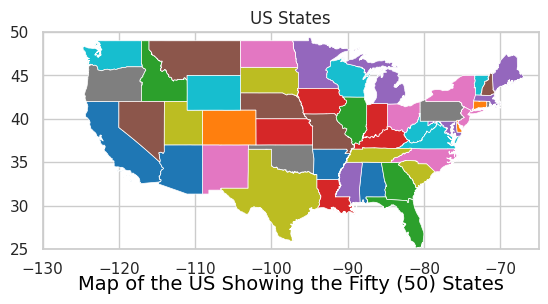

In [ ]:
# Plot the GeoDataFrame without the legend
ax = us_states_gdf.plot("NAME", edgecolor='white', linewidth=0.5)

# Set the desired limits for the x and y axes
ax.set_title('US States')
ax.set_xlim([-130, -65])
ax.set_ylim([25, 50])

# Add a caption
caption = 'Map of the US Showing the Fifty (50) States'
plt.text((ax.get_xlim()[0] + ax.get_xlim()[1]) / 2, ax.get_ylim()[0] - 3, caption,
         fontsize=14, color='black', ha='center', va='top')

# Show the plot
plt.show()


In [ ]:
# Alternative plot of US states

# Plot the US States with a specified figsize
# Set the desired figure size and aspect ratio
# fig, ax = plt.subplots(figsize=(12, 12))
# ax.set_aspect('equal')
# Plot the GeoDataFrame
# us_states_gdf.plot(ax=ax, edgecolor='white', linewidth=0.5,)
# Set the desired limits for the x and y axes
# ax.set_xlim([-130, -65])  # Adjust these values based on your desired zoom level
# ax.set_ylim([25, 50])     # Adjust these values based on your desired zoom level
# Add a caption (inside the fig): plt.text(-129, 26, 'Map of US States', fontsize=14, color='black', ha='left', va='bottom')
# Add a caption outside the plot: plt.text(-135, 52, 'Map of US States', fontsize=14, color='black', ha='left', va='bottom')
# Add a centered caption outside the plot at the bottom
# caption = 'Map of the US Showing the Fifty (50) States'
# plt.text((ax.get_xlim()[0] + ax.get_xlim()[1]) / 2, ax.get_ylim()[0] - 3, caption,
#         fontsize=14, color='black', ha='center', va='top')
# Show the plot
# plt.show()

In [ ]:
# Now, spatial join 'us_geo" and "us_states_gdf" using the "within" tool
# So, this step uses the geometry details of the power plants in "us_geo" to match them to specific locations all across US states in "us_states_gdf"

joined_data = gpd.sjoin(us_geo, us_states_gdf, how="left", op="within")
joined_data

/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning:

The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.



,country_long,Name,gppd_idnr,Total Capacity (MW),Latitude,Longitude,Primary Fuel,Total Estimated 2013 Generation (gwh),Total Estimated 2014 Generation (gwh),Total Estimated 2015 Generation (gwh),...,index_right,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER
24710,United States of America,100 Brook Hill Drive Solar,USA0063292,2.0,41.0930,-73.9828,Solar,0.00,0.00,0.00,...,18.0,36,01779796,0400000US36,36,NY,New York,00,1.220491e+11,1.924699e+10
24711,United States of America,1025 Traveller Solar LLC,USA0062660,5.0,35.4273,-79.1263,Solar,0.00,0.00,0.00,...,15.0,37,01027616,0400000US37,37,NC,North Carolina,00,1.259237e+11,1.346607e+10
24712,United States of America,1047 Little Mountain Solar LLC,USA0062661,3.0,36.1971,-80.8067,Solar,0.00,0.00,0.00,...,15.0,37,01027616,0400000US37,37,NC,North Carolina,00,1.259237e+11,1.346607e+10
24713,United States of America,12 Applegate Solar LLC,USA0059371,1.9,40.2003,-74.5761,Solar,2.92,2.94,3.06,...,41.0,34,01779795,0400000US34,34,NJ,New Jersey,00,1.904783e+10,3.544860e+09
24714,United States of America,126 Grove Solar LLC,USA0060858,2.0,42.0761,-71.4227,Solar,3.01,2.98,3.11,...,37.0,25,00606926,0400000US25,25,MA,Massachusetts,00,2.020513e+10,7.129925e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34538,United States of America,Zion Landfill Gas to Energy Facility,USA0056871,7.0,42.4803,-87.8861,Waste,0.00,0.00,0.00,...,54.0,17,01779784,0400000US17,17,IL,Illinois,00,1.437806e+11,6.214825e+09
34539,United States of America,Zorn,USA0001368,18.0,38.2803,-85.7023,Gas,0.00,0.00,0.00,...,6.0,21,01779786,0400000US21,21,KY,Kentucky,00,1.022795e+11,2.375338e+09
34540,United States of America,Zotos International WPGF,USA0057648,3.4,42.8869,-76.9683,Wind,8.31,8.46,6.57,...,18.0,36,01779796,0400000US36,36,NY,New York,00,1.220491e+11,1.924699e+10
34541,United States of America,Zumbro Community Solar Garden,USA0061574,1.0,44.3195,-92.6703,Solar,0.00,0.00,0.00,...,25.0,27,00662849,0400000US27,27,MN,Minnesota,00,2.062289e+11,1.894522e+10


In [ ]:
# Check if joined_data is set to the specified CRS, EPSG = 4326

from pyproj import CRS

# Use the .crs
current_crs2 = joined_data.crs

# Check if the current CRS is EPSG:4326
if current_crs2 and current_crs2.to_epsg() == 4326:
    print("The GeoDataFrame has EPSG:4326 as its Coordinate Reference System.")
else:
    print("The GeoDataFrame does not have EPSG:4326 as its Coordinate Reference System.")

The GeoDataFrame has EPSG:4326 as its Coordinate Reference System.


In [ ]:
# check the columns
joined_data.columns.unique

<bound method Index.unique of Index(['country_long', 'Name', 'gppd_idnr', 'Total Capacity (MW)', 'Latitude',
       'Longitude', 'Primary Fuel', 'Total Estimated 2013 Generation (gwh)',
       'Total Estimated 2014 Generation (gwh)',
       'Total Estimated 2015 Generation (gwh)',
       'Total Estimated 2016 Generation (gwh)',
       'Total Estimated 2017 Generation (gwh)', 'geometry', 'index_right',
       'STATEFP', 'STATENS', 'AFFGEOID', 'GEOID', 'STUSPS', 'NAME', 'LSAD',
       'ALAND', 'AWATER'],
      dtype='object')>

In [ ]:
# Check if joined_data is a GeoDataFrame
if isinstance(joined_data, gpd.GeoDataFrame):
    print("joined_data is a GeoDataFrame")
else:
    print("joined_data is not a GeoDataFrame")

joined_data is a GeoDataFrame


In [ ]:
# rename the column "NAME" as "State"

joined_data.rename(columns={'NAME': 'State'}, inplace=True)
joined_data

,country_long,Name,gppd_idnr,Total Capacity (MW),Latitude,Longitude,Primary Fuel,Total Estimated 2013 Generation (gwh),Total Estimated 2014 Generation (gwh),Total Estimated 2015 Generation (gwh),...,index_right,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,State,LSAD,ALAND,AWATER
24710,United States of America,100 Brook Hill Drive Solar,USA0063292,2.0,41.0930,-73.9828,Solar,0.00,0.00,0.00,...,18.0,36,01779796,0400000US36,36,NY,New York,00,1.220491e+11,1.924699e+10
24711,United States of America,1025 Traveller Solar LLC,USA0062660,5.0,35.4273,-79.1263,Solar,0.00,0.00,0.00,...,15.0,37,01027616,0400000US37,37,NC,North Carolina,00,1.259237e+11,1.346607e+10
24712,United States of America,1047 Little Mountain Solar LLC,USA0062661,3.0,36.1971,-80.8067,Solar,0.00,0.00,0.00,...,15.0,37,01027616,0400000US37,37,NC,North Carolina,00,1.259237e+11,1.346607e+10
24713,United States of America,12 Applegate Solar LLC,USA0059371,1.9,40.2003,-74.5761,Solar,2.92,2.94,3.06,...,41.0,34,01779795,0400000US34,34,NJ,New Jersey,00,1.904783e+10,3.544860e+09
24714,United States of America,126 Grove Solar LLC,USA0060858,2.0,42.0761,-71.4227,Solar,3.01,2.98,3.11,...,37.0,25,00606926,0400000US25,25,MA,Massachusetts,00,2.020513e+10,7.129925e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34538,United States of America,Zion Landfill Gas to Energy Facility,USA0056871,7.0,42.4803,-87.8861,Waste,0.00,0.00,0.00,...,54.0,17,01779784,0400000US17,17,IL,Illinois,00,1.437806e+11,6.214825e+09
34539,United States of America,Zorn,USA0001368,18.0,38.2803,-85.7023,Gas,0.00,0.00,0.00,...,6.0,21,01779786,0400000US21,21,KY,Kentucky,00,1.022795e+11,2.375338e+09
34540,United States of America,Zotos International WPGF,USA0057648,3.4,42.8869,-76.9683,Wind,8.31,8.46,6.57,...,18.0,36,01779796,0400000US36,36,NY,New York,00,1.220491e+11,1.924699e+10
34541,United States of America,Zumbro Community Solar Garden,USA0061574,1.0,44.3195,-92.6703,Solar,0.00,0.00,0.00,...,25.0,27,00662849,0400000US27,27,MN,Minnesota,00,2.062289e+11,1.894522e+10


In [ ]:
# new
joined_data['geometry'].type

24710    Point
24711    Point
24712    Point
24713    Point
24714    Point
         ...  
34538    Point
34539    Point
34540    Point
34541    Point
34542    Point
Length: 9833, dtype: object

In [ ]:
# extract relevant geospatial details
geo_us_data = joined_data[['State', 'Name', 'Primary Fuel', 'Total Capacity (MW)','Latitude', 'Longitude','GEOID',  'geometry',  'STUSPS', 'LSAD', 'ALAND', 'AWATER']]
geo_us_data

,State,Name,Primary Fuel,Total Capacity (MW),Latitude,Longitude,GEOID,geometry,STUSPS,LSAD,ALAND,AWATER
24710,New York,100 Brook Hill Drive Solar,Solar,2.0,41.0930,-73.9828,36,POINT (-73.98280 41.09300),NY,00,1.220491e+11,1.924699e+10
24711,North Carolina,1025 Traveller Solar LLC,Solar,5.0,35.4273,-79.1263,37,POINT (-79.12630 35.42730),NC,00,1.259237e+11,1.346607e+10
24712,North Carolina,1047 Little Mountain Solar LLC,Solar,3.0,36.1971,-80.8067,37,POINT (-80.80670 36.19710),NC,00,1.259237e+11,1.346607e+10
24713,New Jersey,12 Applegate Solar LLC,Solar,1.9,40.2003,-74.5761,34,POINT (-74.57610 40.20030),NJ,00,1.904783e+10,3.544860e+09
24714,Massachusetts,126 Grove Solar LLC,Solar,2.0,42.0761,-71.4227,25,POINT (-71.42270 42.07610),MA,00,2.020513e+10,7.129925e+09
...,...,...,...,...,...,...,...,...,...,...,...,...
34538,Illinois,Zion Landfill Gas to Energy Facility,Waste,7.0,42.4803,-87.8861,17,POINT (-87.88610 42.48030),IL,00,1.437806e+11,6.214825e+09
34539,Kentucky,Zorn,Gas,18.0,38.2803,-85.7023,21,POINT (-85.70230 38.28030),KY,00,1.022795e+11,2.375338e+09
34540,New York,Zotos International WPGF,Wind,3.4,42.8869,-76.9683,36,POINT (-76.96830 42.88690),NY,00,1.220491e+11,1.924699e+10
34541,Minnesota,Zumbro Community Solar Garden,Solar,1.0,44.3195,-92.6703,27,POINT (-92.67030 44.31950),MN,00,2.062289e+11,1.894522e+10


In [ ]:
# grouped aggregates

# Group by 'State' and calculate the sum of 'capacity_mw' and the mean of 'latitude'
grouped_aggregates = joined_data.groupby('State').agg({'Total Capacity (MW)': 'sum', 'Total Estimated 2013 Generation (gwh)': 'sum', 'Total Estimated 2014 Generation (gwh)': 'sum', 'Total Estimated 2015 Generation (gwh)': 'sum', 'Total Estimated 2016 Generation (gwh)': 'sum', 'Total Estimated 2017 Generation (gwh)': 'sum'})

# rest the index and display the result
grouped_aggregate = grouped_aggregates.reset_index()
grouped_aggregate

,State,Total Capacity (MW),Total Estimated 2013 Generation (gwh),Total Estimated 2014 Generation (gwh),Total Estimated 2015 Generation (gwh),Total Estimated 2016 Generation (gwh),Total Estimated 2017 Generation (gwh)
0,Alabama,30632.90,12816.45,11409.25,11006.52,11864.30,129915.42
1,Alaska,3011.00,1627.55,1727.82,1291.70,1718.87,7917.09
2,Arizona,31359.70,14436.04,16504.68,13945.85,16070.60,125141.75
3,Arkansas,16368.20,4615.92,4677.95,4180.98,4609.42,69529.35
4,California,80747.40,51808.51,59314.95,58295.32,70145.10,254348.62
5,Colorado,18385.90,10438.83,11464.41,10602.32,12626.41,64235.95
6,Connecticut,9114.20,432.74,434.80,344.89,441.66,24035.12
7,Delaware,3595.00,26.59,52.02,53.84,53.21,12675.26
8,District of Columbia,43.90,0.00,0.00,0.00,0.00,91.97
9,Florida,66732.30,300.53,297.17,247.46,328.05,244249.08


# Question 1

2a. Show the total energy capacity of each US state (installed).

2b. Which US state has the highest energy capacity (installed)?

2c. Show the line plot.


In [ ]:
# 1a and # 1b

# Calculate total capacity for each state
total_capacity_by_state = grouped_aggregate.groupby('State')['Total Capacity (MW)'].sum()

# Find the US state with the highest total capacity
highest_capacity_state = total_capacity_by_state.idxmax()
highest_capacity_value = total_capacity_by_state.max()

print("Total Capacity (MW) by State:")
print(total_capacity_by_state)

print("\nUS State with the Highest Total Capacity:")
print(f"{highest_capacity_state}: {highest_capacity_value} MW")

Total Capacity (MW) by State:
State
Alabama                  30632.90
Alaska                    3011.00
Arizona                  31359.70
Arkansas                 16368.20
California               80747.40
Colorado                 18385.90
Connecticut               9114.20
Delaware                  3595.00
District of Columbia        43.90
Florida                  66732.30
Georgia                  39503.20
Guam                       528.00
Hawaii                    3212.20
Idaho                     5927.60
Illinois                 49530.10
Indiana                  29764.30
Iowa                     21524.50
Kansas                   17225.70
Kentucky                 23203.40
Louisiana                27810.60
Maine                     4984.80
Maryland                 16104.10
Massachusetts            14617.50
Michigan                 31734.30
Minnesota                18956.80
Mississippi              16183.90
Missouri                 23090.80
Montana                   6705.70
Nebraska    

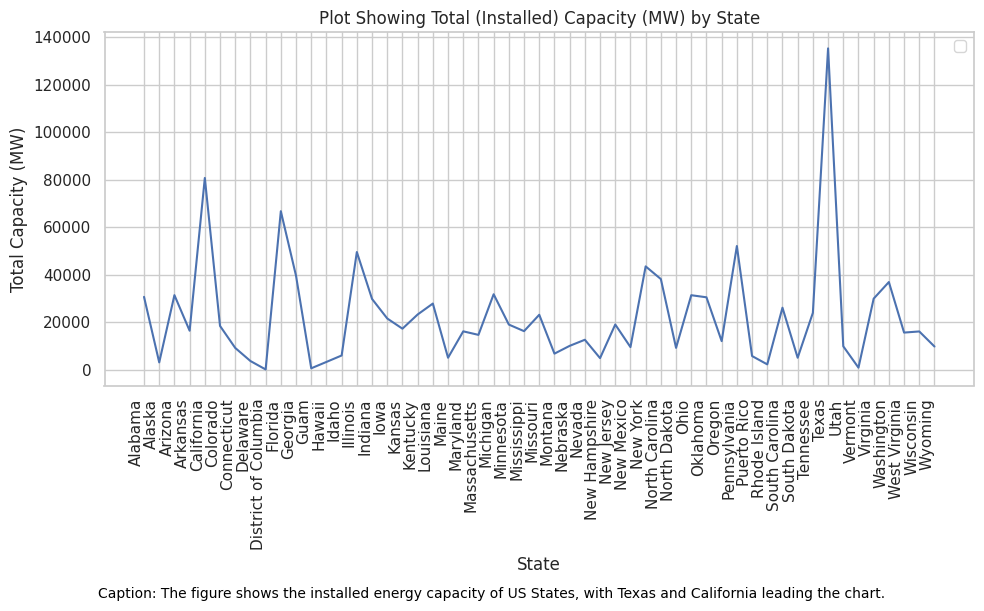

In [ ]:
# 1c

# Plot graphs showing total (installed) capacity of each state

# Plot Total Capacity against each state
plt.figure(figsize=(10, 6))
plt.plot(grouped_aggregate['State'], grouped_aggregate['Total Capacity (MW)'])
plt.title('Plot Showing Total (Installed) Capacity (MW) by State')
plt.xlabel('State')
plt.ylabel('Total Capacity (MW)')


# Rotate x-axis labels for the bar plot
plt.xticks(rotation=90, ha="right")
plt.legend()

# Caption
plt.figtext(0.5, -0.01, 'Caption: The figure shows the installed energy capacity of US States, with Texas and California leading the chart.', ha='center', fontsize=10, color='black')

plt.tight_layout()
plt.show()

# Question 2

2a. Show the total energy generation of each US state for 2013-2017 (generation).

2b. Which US state is the highest power producer (generation) for 2013-2017?

2c. Show the line plots.


In [ ]:
# 2a and 2b

# Create a list of years
years = ['2013', '2014', '2015', '2016', '2017']

# Initialize an empty DataFrame to store the results
generation_by_state_and_year = pd.DataFrame()

# Add the 'State' column to the new DataFrame
generation_by_state_and_year['State'] = grouped_aggregate['State']

# Calculate estimated generation for each state and year
for year in years:
    generation_by_state_and_year[f'Total Estimated {year} Generation (gwh)'] = grouped_aggregate[f'Total Estimated {year} Generation (gwh)']

# Find the US state with the highest estimated generation for each year
highest_generation_state_by_year = generation_by_state_and_year.set_index('State').idxmax(axis=0)
highest_generation_value_by_year = generation_by_state_and_year.set_index('State').max(axis=0)

# Display the estimated generation for each state and year
print("Estimated Generation (gWh) by State for 2013 to 2017:")
print(generation_by_state_and_year)

# Display the US state with the highest estimated generation for each year
result_df = pd.DataFrame({
    'Year': years,
    'State': highest_generation_state_by_year.values,
    'Estimated Generation (gWh)': highest_generation_value_by_year.values
})

print("\nUS State with the Highest Estimated Generation for Each Year:")
print(result_df)

Estimated Generation (gWh) by State for 2013 to 2017:
                   State  Total Estimated 2013 Generation (gwh)  \
0                Alabama                               12816.45   
1                 Alaska                                1627.55   
2                Arizona                               14436.04   
3               Arkansas                                4615.92   
4             California                               51808.51   
5               Colorado                               10438.83   
6            Connecticut                                 432.74   
7               Delaware                                  26.59   
8   District of Columbia                                   0.00   
9                Florida                                 300.53   
10               Georgia                                9532.33   
11                  Guam                                   0.00   
12                Hawaii                                 634.47   
13      

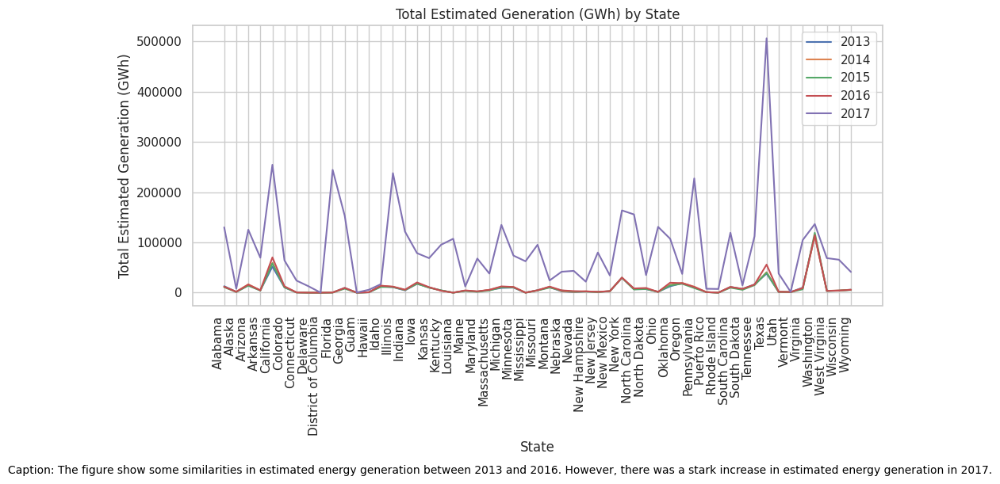

In [ ]:
# 2c

# Plot graphs showing total capacity and total estimated generated for 2013-2017

# Plot Total Estimated Generation against each state
plt.figure(figsize=(10, 6))

years = ['2013', '2014', '2015', '2016', '2017']
for year in years:
    plt.plot(grouped_aggregate['State'], grouped_aggregate[f'Total Estimated {year} Generation (gwh)'], label=year, linestyle='-')

plt.title('Total Estimated Generation (GWh) by State')
plt.xlabel('State')
plt.ylabel('Total Estimated Generation (GWh)')
plt.legend()

# Rotate x-axis labels for the line plot
plt.xticks(rotation=90, ha="right")

# Caption for the second plot
plt.figtext(0.5, -0.01, 'Caption: The figure show some similarities in estimated energy generation between 2013 and 2016. However, there was a stark increase in estimated energy generation in 2017.', ha='center', fontsize=10, color='black')

plt.tight_layout()
plt.show()

# Question 3

3a. 3a. Using appropriate maps, how are the power plants distributed in the dataset according to the main fuel sources (as a whole)? **done**

3b. Based on energy type?

3c. Based on unit counts?

3d. Based on total capacity?

3e.Which state has the highest number of power plants - that is, unit count?



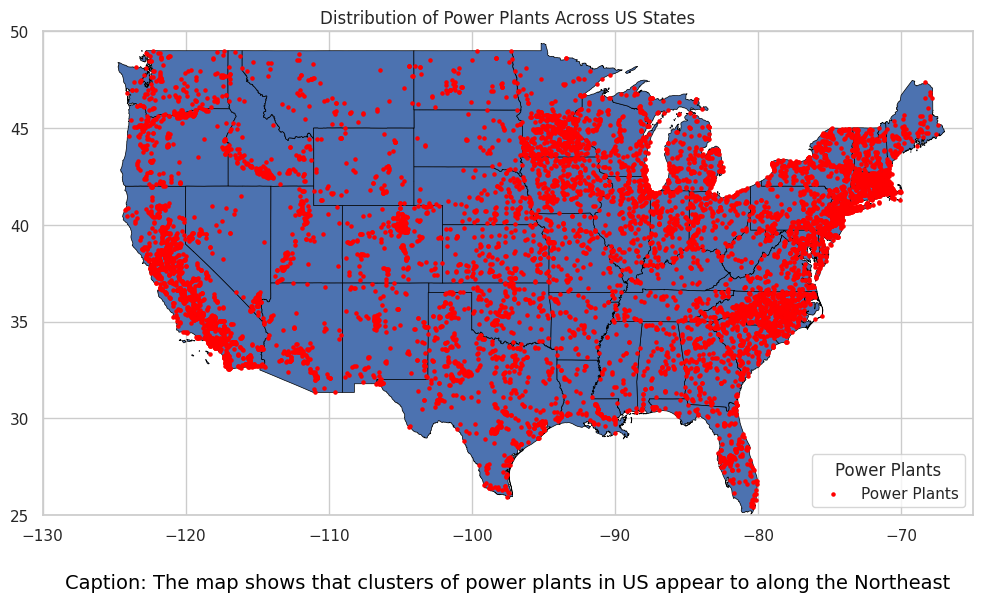

In [ ]:
# 3a

# Plot the US States with the distribution of the power plants

# Set the desired figure size and aspect ratio
fig, ax = plt.subplots(figsize=(12, 18))
ax.set_aspect('equal')

# Plot the GeoDataFrame for US States
us_states_gdf.plot(ax=ax, edgecolor='black', linewidth=0.5, legend=True, legend_kwds={'label': 'US States'})


# Plot the power plants on top of the US States map
geo_us_data.plot(ax=ax, marker='o', color='red', markersize=5, label='Power Plants')

# Set the desired limits for the x and y axes
ax.set_xlim([-130, -65])  # Adjust these values based on your desired zoom level
ax.set_ylim([25, 50])     # Adjust these values based on your desired zoom level

# Add a title
plt.title('Distribution of Power Plants Across US States')

# Add a caption outside the plot at the bottom
caption = 'Caption: The map shows that clusters of power plants in US appear to along the Northeast'
plt.text((ax.get_xlim()[0] + ax.get_xlim()[1]) / 2, ax.get_ylim()[0] - 3, caption,
         fontsize=14, color='black', ha='center', va='top')

# Show the legend with improved formatting
plt.legend(title='Power Plants', loc='lower right')

# Show the plot
plt.show()

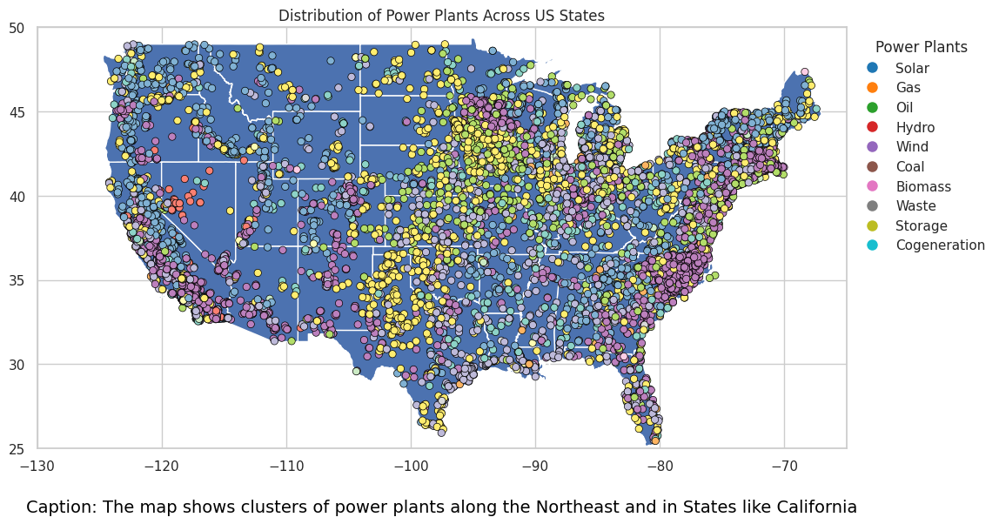

In [ ]:
# 3bi

# Plot the US States with the distribution of the power plants

# Set the desired figure size and aspect ratio
fig, ax = plt.subplots(figsize=(12, 18))
ax.set_aspect('equal')

# Plot the GeoDataFrame for US States with improved edge color
us_states_gdf.plot(ax=ax, edgecolor='white', linewidth=1, legend=True, legend_kwds={'label': 'US States'})

# Plot the power plants on top of the US States map with a high contrast colormap
geo_us_data.plot(column='Primary Fuel', ax=ax, edgecolor='black', linewidth=0.5, cmap='Set3', legend=False)

# Set the desired limits for the x and y axes
ax.set_xlim([-130, -65])  # Adjust these values based on your desired zoom level
ax.set_ylim([25, 50])     # Adjust these values based on your desired zoom level

# Add a title
plt.title('Distribution of Power Plants Across US States')

# Add a caption outside the plot at the bottom
caption = 'Caption: The map shows clusters of power plants along the Northeast and in States like California'
plt.text((ax.get_xlim()[0] + ax.get_xlim()[1]) / 2, ax.get_ylim()[0] - 3, caption,
         fontsize=14, color='black', ha='center', va='top')

# Create a custom legend for power plant types with unique marker colors
legend_labels = geo_us_data['Primary Fuel'].unique()
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10) for color in plt.get_cmap('tab10').colors[:len(legend_labels)]]

# Show the custom legend with adjusted position outside the map
ax.legend(legend_handles, legend_labels, title='Power Plants', loc='upper left', bbox_to_anchor=(1, 1), frameon=False)

# Show the plot
plt.show()

In [ ]:
# chloropeth based on number of power plants in each state
# power plant distribution by state

import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Assuming your DataFrame is named 'df'
# Assuming you have a GeoDataFrame for US states named 'us_states_gdf'

# Group by state and count the number of power plants in each state
power_plants_count_by_state = geo_us_data.groupby('State')['Total Capacity (MW)'].count().reset_index()
power_plants_count_by_state.rename(columns={'Total Capacity (MW)': 'Power Plant Count'}, inplace=True)
power_plants_count_by_state

,State,Power Plant Count
0,Alabama,78
1,Alaska,141
2,Arizona,140
3,Arkansas,61
4,California,1459
5,Colorado,213
6,Connecticut,124
7,Delaware,29
8,District of Columbia,6
9,Florida,185


In [ ]:
# Rename the column "NAME" in us_states_gdf
us_states_gdf_new = us_states_gdf.rename(columns={'NAME': 'State'})

# reset the index and display the result
us_states_gdf_new

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,State,LSAD,ALAND,AWATER,geometry
0,31,01779792,0400000US31,31,NE,Nebraska,00,198956658395,1371829134,"POLYGON ((-104.05351 41.15726, -104.05267 41.2..."
1,53,01779804,0400000US53,53,WA,Washington,00,172112588220,12559278850,"MULTIPOLYGON (((-122.32834 48.02134, -122.3217..."
2,35,00897535,0400000US35,35,NM,New Mexico,00,314196306401,728776523,"POLYGON ((-109.05017 31.48000, -109.04984 31.4..."
3,46,01785534,0400000US46,46,SD,South Dakota,00,196346981786,3382720225,"POLYGON ((-104.05770 44.99743, -104.05021 44.9..."
4,48,01779801,0400000US48,48,TX,Texas,00,676653171537,19006305260,"POLYGON ((-106.64548 31.89867, -106.64084 31.9..."
5,06,01779778,0400000US06,06,CA,California,00,403503931312,20463871877,"MULTIPOLYGON (((-118.60337 33.47810, -118.5987..."
6,21,01779786,0400000US21,21,KY,Kentucky,00,102279490672,2375337755,"MULTIPOLYGON (((-89.40565 36.52817, -89.39869 ..."
7,39,01085497,0400000US39,39,OH,Ohio,00,105828882568,10268850702,"MULTIPOLYGON (((-82.73571 41.60336, -82.71880 ..."
8,01,01779775,0400000US01,01,AL,Alabama,00,131174048583,4593327154,"MULTIPOLYGON (((-88.04374 30.51742, -88.03661 ..."
9,13,01705317,0400000US13,13,GA,Georgia,00,149482048342,4422936154,"POLYGON ((-85.60516 34.98468, -85.55259 34.984..."


In [ ]:
# merge power_plants_count_by_state to us_states_new
merged_by_state = us_states_gdf_new.merge(power_plants_count_by_state, on='State')

# Display the merged DataFrame
merged_by_state

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,State,LSAD,ALAND,AWATER,geometry,Power Plant Count
0,31,01779792,0400000US31,31,NE,Nebraska,00,198956658395,1371829134,"POLYGON ((-104.05351 41.15726, -104.05267 41.2...",112
1,53,01779804,0400000US53,53,WA,Washington,00,172112588220,12559278850,"MULTIPOLYGON (((-122.32834 48.02134, -122.3217...",140
2,35,00897535,0400000US35,35,NM,New Mexico,00,314196306401,728776523,"POLYGON ((-109.05017 31.48000, -109.04984 31.4...",120
3,46,01785534,0400000US46,46,SD,South Dakota,00,196346981786,3382720225,"POLYGON ((-104.05770 44.99743, -104.05021 44.9...",40
4,48,01779801,0400000US48,48,TX,Texas,00,676653171537,19006305260,"POLYGON ((-106.64548 31.89867, -106.64084 31.9...",481
5,06,01779778,0400000US06,06,CA,California,00,403503931312,20463871877,"MULTIPOLYGON (((-118.60337 33.47810, -118.5987...",1459
6,21,01779786,0400000US21,21,KY,Kentucky,00,102279490672,2375337755,"MULTIPOLYGON (((-89.40565 36.52817, -89.39869 ...",53
7,39,01085497,0400000US39,39,OH,Ohio,00,105828882568,10268850702,"MULTIPOLYGON (((-82.73571 41.60336, -82.71880 ...",170
8,01,01779775,0400000US01,01,AL,Alabama,00,131174048583,4593327154,"MULTIPOLYGON (((-88.04374 30.51742, -88.03661 ...",78
9,13,01705317,0400000US13,13,GA,Georgia,00,149482048342,4422936154,"POLYGON ((-85.60516 34.98468, -85.55259 34.984...",181


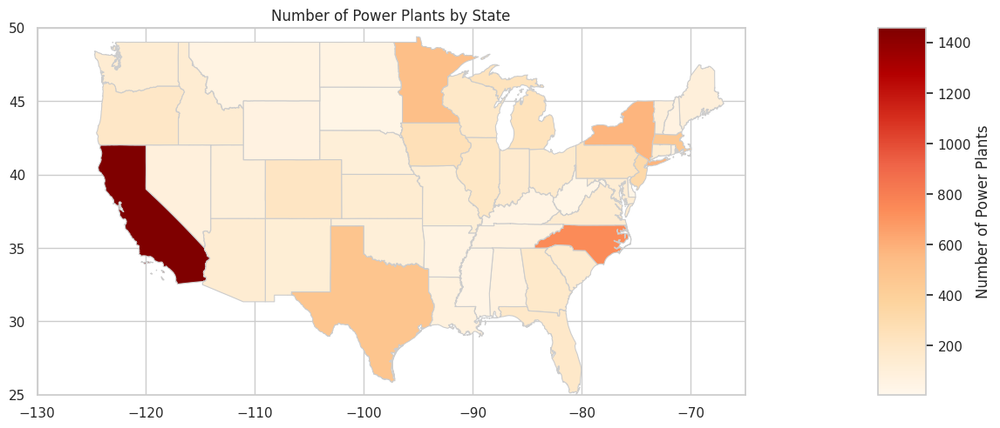

In [ ]:
# 3ci (Chloropeth)

# Plot the choropleth map
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_title('Number of Power Plants by State')

merged_by_state.plot(column='Power Plant Count', cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=False)

# Set the desired limits for the x and y axes
ax.set_xlim([-130, -65])  # Adjust these values based on your desired zoom level
ax.set_ylim([25, 50])     # Adjust these values based on your desired zoom level

# Add colorbar
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=merged_by_state['Power Plant Count'].min(), vmax=merged_by_state['Power Plant Count'].max()))
sm._A = []
fig.colorbar(sm, cax=cax, label='Number of Power Plants')

plt.show()

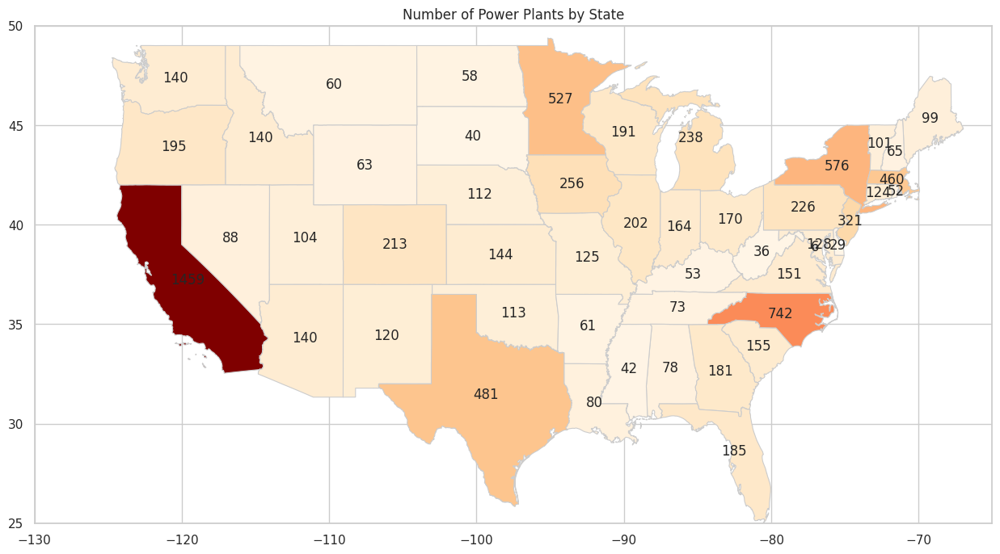

In [ ]:
# 3cii (Chloropeth)

# Alternative chloropeth map (showing corresponding number of power plants directly on the map rather than using a seperate legend)

#Plot the choropleth map
fig, ax = plt.subplots(figsize=(20, 8))
ax.set_title('Number of Power Plants by State')

merged_by_state.plot(column='Power Plant Count', cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=False)

# Set the desired limits for the x and y axes
ax.set_xlim([-130, -65]) # Adjust these values based on your desired zoom level
ax.set_ylim([25, 50]) # Adjust these values based on your desired zoom level

# Annotate the number of power plants on each state centroid
for i, row in merged_by_state.iterrows():
  centroid = row.geometry.centroid
  power_plant_count = row['Power Plant Count']
  ax.annotate(power_plant_count, xy=(centroid.x, centroid.y), ha='center', va='center')

# Remove the colorbar (we commented out the legend that the codes below would otherwise have produced)
# divider = make_axes_locatable(ax)
# cax = divider.append_axes("right", size="5%", pad=0.1)
# sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=merged_by_state['Power Plant Count'].min(), vmax=merged_by_state['Power Plant Count'].max()))
# sm._A = []
# fig.colorbar(sm, cax=cax, label='Number of Power Plants')

plt.show()

In [ ]:
# merge grouped_aggregate to us_states_new
merged_by_state_full = merged_by_state.merge(grouped_aggregate, on='State')

# Display the merged DataFrame
merged_by_state_full

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,State,LSAD,ALAND,AWATER,geometry,Power Plant Count,Total Capacity (MW),Total Estimated 2013 Generation (gwh),Total Estimated 2014 Generation (gwh),Total Estimated 2015 Generation (gwh),Total Estimated 2016 Generation (gwh),Total Estimated 2017 Generation (gwh)
0,31,01779792,0400000US31,31,NE,Nebraska,00,198956658395,1371829134,"POLYGON ((-104.05351 41.15726, -104.05267 41.2...",112,9984.50,2555.12,3129.35,4310.04,4578.03,41668.93
1,53,01779804,0400000US53,53,WA,Washington,00,172112588220,12559278850,"MULTIPOLYGON (((-122.32834 48.02134, -122.3217...",140,36881.40,113499.27,112679.72,118984.57,114385.31,136429.49
2,35,00897535,0400000US35,35,NM,New Mexico,00,314196306401,728776523,"POLYGON ((-109.05017 31.48000, -109.04984 31.4...",120,9462.20,2939.70,2894.80,2875.06,3060.65,34154.14
3,46,01785534,0400000US46,46,SD,South Dakota,00,196346981786,3382720225,"POLYGON ((-104.05770 44.99743, -104.05021 44.9...",40,4979.50,7254.67,6778.85,5674.73,7528.79,14567.83
4,48,01779801,0400000US48,48,TX,Texas,00,676653171537,19006305260,"POLYGON ((-106.64548 31.89867, -106.64084 31.9...",481,135357.30,37925.75,40700.91,39773.89,55835.97,505893.93
5,06,01779778,0400000US06,06,CA,California,00,403503931312,20463871877,"MULTIPOLYGON (((-118.60337 33.47810, -118.5987...",1459,80747.40,51808.51,59314.95,58295.32,70145.10,254348.62
6,21,01779786,0400000US21,21,KY,Kentucky,00,102279490672,2375337755,"MULTIPOLYGON (((-89.40565 36.52817, -89.39869 ...",53,23203.40,4370.17,4183.92,4567.71,3770.13,95332.73
7,39,01085497,0400000US39,39,OH,Ohio,00,105828882568,10268850702,"MULTIPOLYGON (((-82.73571 41.60336, -82.71880 ...",170,31330.90,1669.57,1610.64,1470.30,1567.43,130867.62
8,01,01779775,0400000US01,01,AL,Alabama,00,131174048583,4593327154,"MULTIPOLYGON (((-88.04374 30.51742, -88.03661 ...",78,30632.90,12816.45,11409.25,11006.52,11864.30,129915.42
9,13,01705317,0400000US13,13,GA,Georgia,00,149482048342,4422936154,"POLYGON ((-85.60516 34.98468, -85.55259 34.984...",181,39503.20,9532.33,9107.68,7940.37,9369.39,153024.72


In [ ]:
# select relevant columns:

select_merged_by_state = merged_by_state_full[['State','Power Plant Count','Total Capacity (MW)', 'Total Estimated 2013 Generation (gwh)', 'Total Estimated 2014 Generation (gwh)','Total Estimated 2015 Generation (gwh)','Total Estimated 2016 Generation (gwh)','Total Estimated 2017 Generation (gwh)','geometry']]
select_merged_by_state

,State,Power Plant Count,Total Capacity (MW),Total Estimated 2013 Generation (gwh),Total Estimated 2014 Generation (gwh),Total Estimated 2015 Generation (gwh),Total Estimated 2016 Generation (gwh),Total Estimated 2017 Generation (gwh),geometry
0,Nebraska,112,9984.50,2555.12,3129.35,4310.04,4578.03,41668.93,"POLYGON ((-104.05351 41.15726, -104.05267 41.2..."
1,Washington,140,36881.40,113499.27,112679.72,118984.57,114385.31,136429.49,"MULTIPOLYGON (((-122.32834 48.02134, -122.3217..."
2,New Mexico,120,9462.20,2939.70,2894.80,2875.06,3060.65,34154.14,"POLYGON ((-109.05017 31.48000, -109.04984 31.4..."
3,South Dakota,40,4979.50,7254.67,6778.85,5674.73,7528.79,14567.83,"POLYGON ((-104.05770 44.99743, -104.05021 44.9..."
4,Texas,481,135357.30,37925.75,40700.91,39773.89,55835.97,505893.93,"POLYGON ((-106.64548 31.89867, -106.64084 31.9..."
5,California,1459,80747.40,51808.51,59314.95,58295.32,70145.10,254348.62,"MULTIPOLYGON (((-118.60337 33.47810, -118.5987..."
6,Kentucky,53,23203.40,4370.17,4183.92,4567.71,3770.13,95332.73,"MULTIPOLYGON (((-89.40565 36.52817, -89.39869 ..."
7,Ohio,170,31330.90,1669.57,1610.64,1470.30,1567.43,130867.62,"MULTIPOLYGON (((-82.73571 41.60336, -82.71880 ..."
8,Alabama,78,30632.90,12816.45,11409.25,11006.52,11864.30,129915.42,"MULTIPOLYGON (((-88.04374 30.51742, -88.03661 ..."
9,Georgia,181,39503.20,9532.33,9107.68,7940.37,9369.39,153024.72,"POLYGON ((-85.60516 34.98468, -85.55259 34.984..."


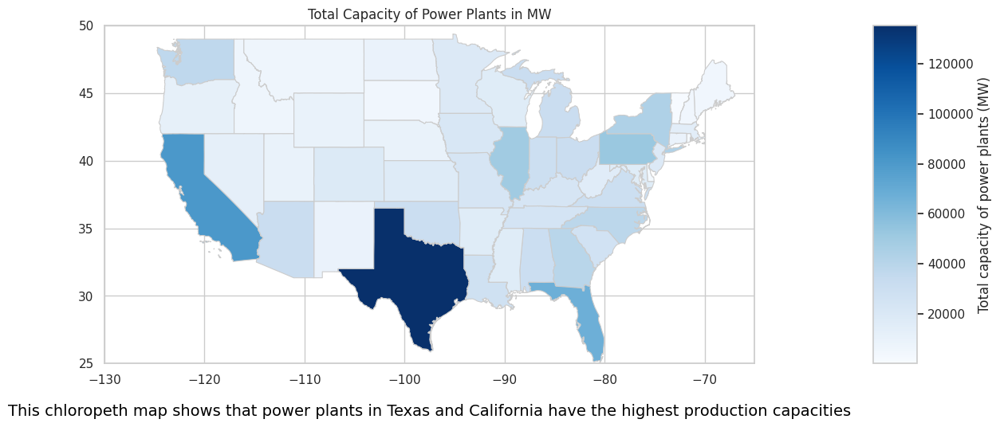

In [ ]:
# 3d

# Plot the choropleth map with a different colormap
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_title('Total Capacity of Power Plants in MW')

merged_by_state_full.plot(column='Total Capacity (MW)', cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8', legend=False)

# Set the desired limits for the x and y axes
ax.set_xlim([-130, -65])  # Adjust these values based on your desired zoom level
ax.set_ylim([25, 50])  # Adjust these values based on your desired zoom level

# Add a centered caption outside the plot at the bottom
caption = 'This chloropeth map shows that power plants in Texas and California have the highest production capacities'
plt.text((ax.get_xlim()[0] + ax.get_xlim()[1]) / 2, ax.get_ylim()[0] - 3, caption,
         fontsize=14, color='black', ha='center', va='top')

# Add colorbar with reduced pad value to move it closer to the map
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=merged_by_state_full['Total Capacity (MW)'].min(), vmax=merged_by_state_full['Total Capacity (MW)'].max()))
sm._A = []
fig.colorbar(sm, cax=cax, label='Total capacity of power plants (MW)')

plt.show()

In [ ]:
# re-load the groud_aggregate dataframe which contains relevant data at the state level

grouped_aggregate

,State,Total Capacity (MW),Total Estimated 2013 Generation (gwh),Total Estimated 2014 Generation (gwh),Total Estimated 2015 Generation (gwh),Total Estimated 2016 Generation (gwh),Total Estimated 2017 Generation (gwh)
0,Alabama,30632.90,12816.45,11409.25,11006.52,11864.30,129915.42
1,Alaska,3011.00,1627.55,1727.82,1291.70,1718.87,7917.09
2,Arizona,31359.70,14436.04,16504.68,13945.85,16070.60,125141.75
3,Arkansas,16368.20,4615.92,4677.95,4180.98,4609.42,69529.35
4,California,80747.40,51808.51,59314.95,58295.32,70145.10,254348.62
5,Colorado,18385.90,10438.83,11464.41,10602.32,12626.41,64235.95
6,Connecticut,9114.20,432.74,434.80,344.89,441.66,24035.12
7,Delaware,3595.00,26.59,52.02,53.84,53.21,12675.26
8,District of Columbia,43.90,0.00,0.00,0.00,0.00,91.97
9,Florida,66732.30,300.53,297.17,247.46,328.05,244249.08


In [ ]:
# Slightly modify "grouped_aggregate" dataframe by adding to it 'PowerPlantCount' column from the "merged_by_state_full" geodataframe

# Add the 'population' column from the 'abde' DataFrame to the 'seat' DataFrame
grouped_aggregate['Power Plant Count'] = merged_by_state_full['Power Plant Count']

# Print the modified 'seat' DataFrame
grouped_aggregate

,State,Total Capacity (MW),Total Estimated 2013 Generation (gwh),Total Estimated 2014 Generation (gwh),Total Estimated 2015 Generation (gwh),Total Estimated 2016 Generation (gwh),Total Estimated 2017 Generation (gwh),Power Plant Count
0,Alabama,30632.90,12816.45,11409.25,11006.52,11864.30,129915.42,112
1,Alaska,3011.00,1627.55,1727.82,1291.70,1718.87,7917.09,140
2,Arizona,31359.70,14436.04,16504.68,13945.85,16070.60,125141.75,120
3,Arkansas,16368.20,4615.92,4677.95,4180.98,4609.42,69529.35,40
4,California,80747.40,51808.51,59314.95,58295.32,70145.10,254348.62,481
5,Colorado,18385.90,10438.83,11464.41,10602.32,12626.41,64235.95,1459
6,Connecticut,9114.20,432.74,434.80,344.89,441.66,24035.12,53
7,Delaware,3595.00,26.59,52.02,53.84,53.21,12675.26,170
8,District of Columbia,43.90,0.00,0.00,0.00,0.00,91.97,78
9,Florida,66732.30,300.53,297.17,247.46,328.05,244249.08,181


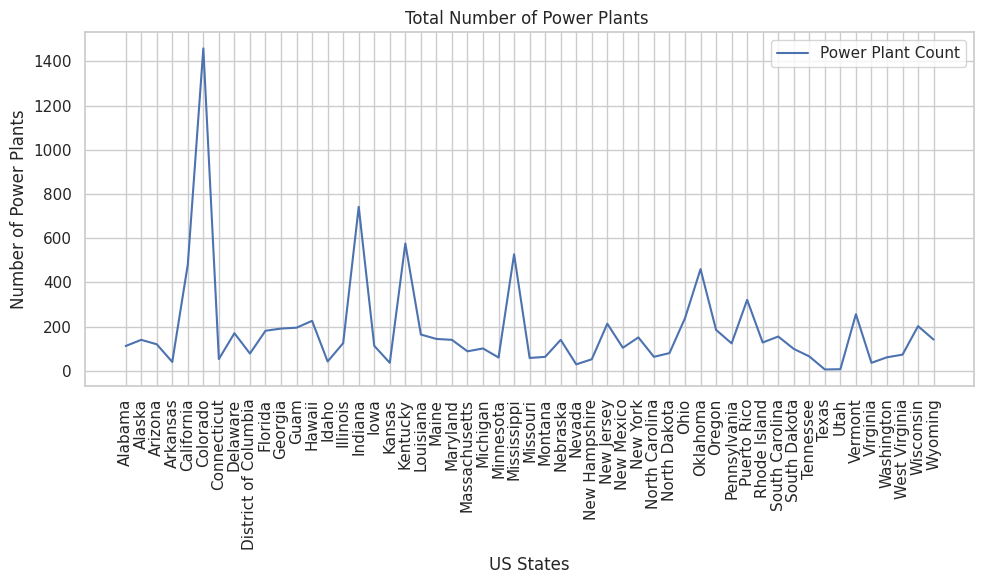

In [ ]:
# Create a line graph
plt.figure(figsize=(10, 6))
plt.plot(grouped_aggregate['State'], grouped_aggregate['Power Plant Count'], linestyle='-', label='Power Plant Count')

plt.xlabel('US States')
plt.ylabel('Number of Power Plants')
plt.title('Total Number of Power Plants ')
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()
plt.savefig('line_graph.jpg')
plt.show()

In [ ]:
# 3e

# Find the state with the highest number of power plants
state_with_highest_power_plants = power_plants_count_by_state.loc[power_plants_count_by_state['Power Plant Count'].idxmax()]

# Display the result
print("State with the Highest Number of Power Plants:")
print(state_with_highest_power_plants)

State with the Highest Number of Power Plants:
State                California
Power Plant Count          1459
Name: 4, dtype: object


In [ ]:
# descriptive statistics

grouped_aggregate.describe()

,Total Capacity (MW),Total Estimated 2013 Generation (gwh),Total Estimated 2014 Generation (gwh),Total Estimated 2015 Generation (gwh),Total Estimated 2016 Generation (gwh),Total Estimated 2017 Generation (gwh),Power Plant Count
count,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000
mean,22639.068868,9905.302264,10343.466792,9893.297925,11199.541698,87288.390566,185.169811
std,23065.256400,17414.146105,17799.704163,18414.647709,19188.199746,88022.250575,232.013406
min,43.900000,0.000000,0.000000,0.000000,0.000000,91.970000,6.000000
25%,9114.200000,1627.550000,1610.640000,1464.180000,1704.630000,24314.530000,63.000000
50%,16368.200000,4820.910000,5305.640000,4567.710000,5509.680000,68668.930000,125.000000
75%,30452.200000,10922.230000,11488.800000,10602.320000,12012.460000,121522.330000,191.000000
max,135357.300000,113499.270000,112679.720000,118984.570000,114385.310000,505893.930000,1459.000000


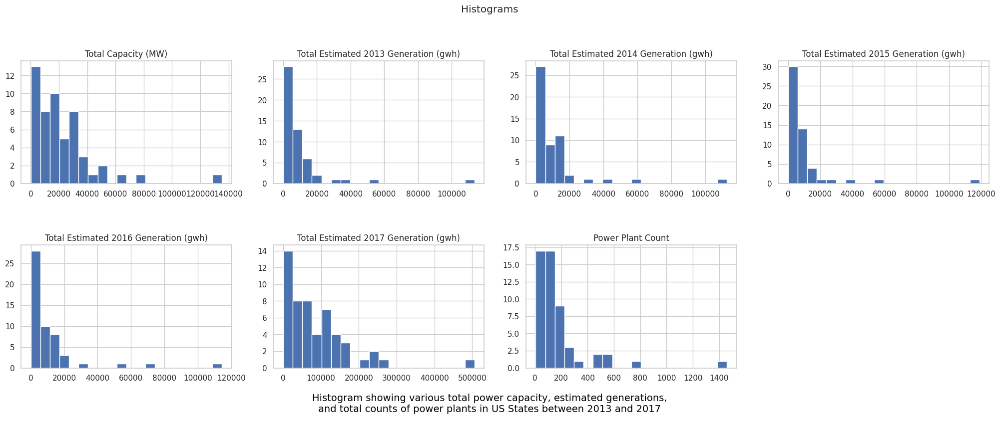

In [ ]:
# Histogram diagrams

# Exclude the 'State' column
numerical_columns = grouped_aggregate.columns[1:]

# Create subplots with two rows and four columns
fig, axes = plt.subplots(2, 4, figsize=(25, 8))
plt.subplots_adjust(hspace=0.5)  # Increase vertical spacing between subplots

# Flatten the 2x4 array of subplots for easier indexing
axes = axes.flatten()

# Get the histogram of the columns of interest
for i, column in enumerate(numerical_columns):
    grouped_aggregate[column].hist(bins=20, ax=axes[i])
    axes[i].set_title(column)

# Remove the empty frame for the 'State' column
fig.delaxes(axes[-1])

# Add a caption to the entire set of subplots
caption = """
Histogram showing various total power capacity, estimated generations,
and total counts of power plants in US States between 2013 and 2017
"""
fig.suptitle('Histograms', y=1.02)  # Add a title above the plots
fig.text(0.5, 0.02, caption, ha='center', va='center', fontsize=14, color='black')

plt.show()

In [ ]:
geo_us_data

,State,Name,Primary Fuel,Total Capacity (MW),Latitude,Longitude,GEOID,geometry,STUSPS,LSAD,ALAND,AWATER
24710,New York,100 Brook Hill Drive Solar,Solar,2.0,41.0930,-73.9828,36,POINT (-73.98280 41.09300),NY,00,1.220491e+11,1.924699e+10
24711,North Carolina,1025 Traveller Solar LLC,Solar,5.0,35.4273,-79.1263,37,POINT (-79.12630 35.42730),NC,00,1.259237e+11,1.346607e+10
24712,North Carolina,1047 Little Mountain Solar LLC,Solar,3.0,36.1971,-80.8067,37,POINT (-80.80670 36.19710),NC,00,1.259237e+11,1.346607e+10
24713,New Jersey,12 Applegate Solar LLC,Solar,1.9,40.2003,-74.5761,34,POINT (-74.57610 40.20030),NJ,00,1.904783e+10,3.544860e+09
24714,Massachusetts,126 Grove Solar LLC,Solar,2.0,42.0761,-71.4227,25,POINT (-71.42270 42.07610),MA,00,2.020513e+10,7.129925e+09
...,...,...,...,...,...,...,...,...,...,...,...,...
34538,Illinois,Zion Landfill Gas to Energy Facility,Waste,7.0,42.4803,-87.8861,17,POINT (-87.88610 42.48030),IL,00,1.437806e+11,6.214825e+09
34539,Kentucky,Zorn,Gas,18.0,38.2803,-85.7023,21,POINT (-85.70230 38.28030),KY,00,1.022795e+11,2.375338e+09
34540,New York,Zotos International WPGF,Wind,3.4,42.8869,-76.9683,36,POINT (-76.96830 42.88690),NY,00,1.220491e+11,1.924699e+10
34541,Minnesota,Zumbro Community Solar Garden,Solar,1.0,44.3195,-92.6703,27,POINT (-92.67030 44.31950),MN,00,2.062289e+11,1.894522e+10


In [ ]:
geo_us_data.columns

Index(['State', 'Name', 'Primary Fuel', 'Total Capacity (MW)', 'Latitude',
       'Longitude', 'GEOID', 'geometry', 'STUSPS', 'LSAD', 'ALAND', 'AWATER'],
      dtype='object')

In [ ]:
geo_us_data['Primary Fuel'].unique

<bound method Series.unique of 24710    Solar
24711    Solar
24712    Solar
24713    Solar
24714    Solar
         ...  
34538    Waste
34539      Gas
34540     Wind
34541    Solar
34542      Gas
Name: Primary Fuel, Length: 9833, dtype: object>

In [ ]:
# Group the data by state and calculate the sum of the "capacity_mw" column
state_cap_energy_type = geo_us_data.groupby(['State', 'Primary Fuel'])['Total Capacity (MW)'].sum()

# Print the volume of energy produced in per energy type in each state
state_cap_energy_type = state_cap_energy_type.reset_index()
state_cap_energy_type

,State,Primary Fuel,Total Capacity (MW)
0,Alabama,Biomass,602.7
1,Alabama,Coal,3360.0
2,Alabama,Gas,17592.2
3,Alabama,Hydro,3486.3
4,Alabama,Nuclear,5270.4
...,...,...,...
459,Wyoming,Hydro,303.4
460,Wyoming,Oil,4.7
461,Wyoming,Other,11.5
462,Wyoming,Solar,92.0


# Question 4

4a. What are the total count and average capacity (measure of effiency) of each energy types?

4b. Overall, which primary_fuel type is the most efficient (that is, that has the largest average production)?

4c. Draw a map showing the total capacity by primary Fuel (energy type) and State.

4d. Create a graph (and bar chart) of total capacity, count, and average production of each enery type (primary_fuel type).


In [ ]:
# 4a.

# What are the primary_fuel types in each state and their sizes?

primary_fuel_by_state = joined_data.groupby(['State', 'Primary Fuel']).size().reset_index(name='Total Count')
print("1. Primary Fuel Types in Each State and Their Sizes:")
primary_fuel_by_state

1. Primary Fuel Types in Each State and Their Sizes:


,State,Primary Fuel,Total Count
0,Alabama,Biomass,10
1,Alabama,Coal,2
2,Alabama,Gas,27
3,Alabama,Hydro,24
4,Alabama,Nuclear,2
...,...,...,...
459,Wyoming,Hydro,16
460,Wyoming,Oil,2
461,Wyoming,Other,1
462,Wyoming,Solar,1


In [ ]:
# merge state_cap_energy_type to primary_fuel_by_state
merged_energy_type_state = state_cap_energy_type.merge(primary_fuel_by_state, on=['State', 'Primary Fuel'])

# Display the merged DataFrame
merged_energy_type_state

,State,Primary Fuel,Total Capacity (MW),Total Count
0,Alabama,Biomass,602.7,10
1,Alabama,Coal,3360.0,2
2,Alabama,Gas,17592.2,27
3,Alabama,Hydro,3486.3,24
4,Alabama,Nuclear,5270.4,2
...,...,...,...,...
459,Wyoming,Hydro,303.4,16
460,Wyoming,Oil,4.7,2
461,Wyoming,Other,11.5,1
462,Wyoming,Solar,92.0,1


In [ ]:
# Total volume (capacity in MW) of each energy type

# Group the data by primary_fuel and calculate the sum of the "capacity_mw" column
total_capacity_by_fuel = merged_energy_type_state.groupby('Primary Fuel')[['Total Capacity (MW)','Total Count']].sum().reset_index()

# Print the total volume of each energy type across the states
total_capacity_by_fuel

,Primary Fuel,Total Capacity (MW),Total Count
0,Biomass,5105.60,150
1,Coal,248521.90,285
2,Cogeneration,1042.00,34
3,Gas,544633.90,1813
4,Geothermal,3889.20,65
5,Hydro,101586.90,1447
6,Nuclear,102070.20,57
7,Oil,37129.60,873
8,Other,572.40,16
9,Petcoke,2361.60,11


In [ ]:
# calculate the average production (or efficiency) of each primary fuel type and add it to the total_capacity_by_fuel dataframe

# Add the "Average Production" column
total_capacity_by_fuel["Average Capacity"] = total_capacity_by_fuel["Total Capacity (MW)"] / total_capacity_by_fuel["Total Count"]
total_capacity_by_fuel

,Primary Fuel,Total Capacity (MW),Total Count,Average Capacity
0,Biomass,5105.60,150,34.037333
1,Coal,248521.90,285,872.006667
2,Cogeneration,1042.00,34,30.647059
3,Gas,544633.90,1813,300.404799
4,Geothermal,3889.20,65,59.833846
5,Hydro,101586.90,1447,70.205183
6,Nuclear,102070.20,57,1790.705263
7,Oil,37129.60,873,42.531042
8,Other,572.40,16,35.775000
9,Petcoke,2361.60,11,214.690909


In [ ]:
# 4b

# Find the primary fuel with the largest average production
most_efficient_fuel = total_capacity_by_fuel[total_capacity_by_fuel["Average Capacity"] == total_capacity_by_fuel["Average Capacity"].max()]["Primary Fuel"].values[0]

print(f"The most efficient primary fuel type(that is, that has the largest average capacity)  is {most_efficient_fuel}.")

The most efficient primary fuel type(that is, that has the largest average capacity)  is Nuclear.


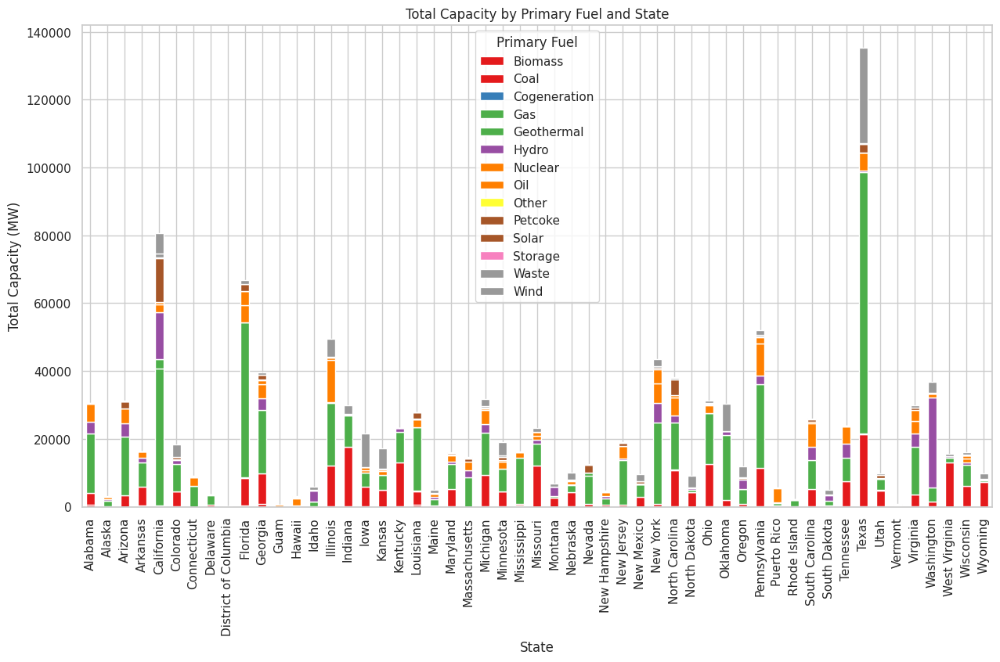

In [ ]:
# 4c

# Pivot the DataFrame to have 'Primary Fuel' as columns
pivot_df = merged_energy_type_state.pivot(index='State', columns='Primary Fuel', values='Total Capacity (MW)')

# Plot a grouped bar chart
ax = pivot_df.plot(kind='bar', stacked=True, colormap='Set1', figsize=(15, 8))

# Add labels and title
ax.set_ylabel('Total Capacity (MW)')
ax.set_xlabel('State')
plt.title('Total Capacity by Primary Fuel and State')

# Show the plot
plt.show()

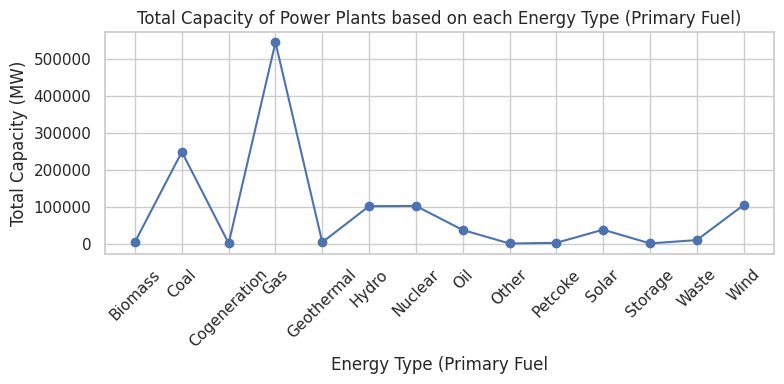

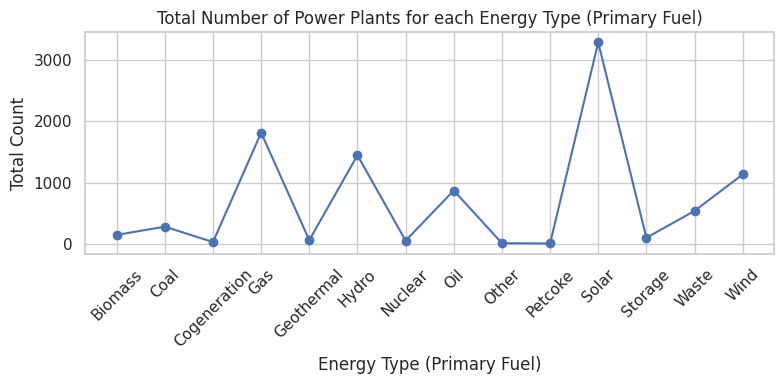

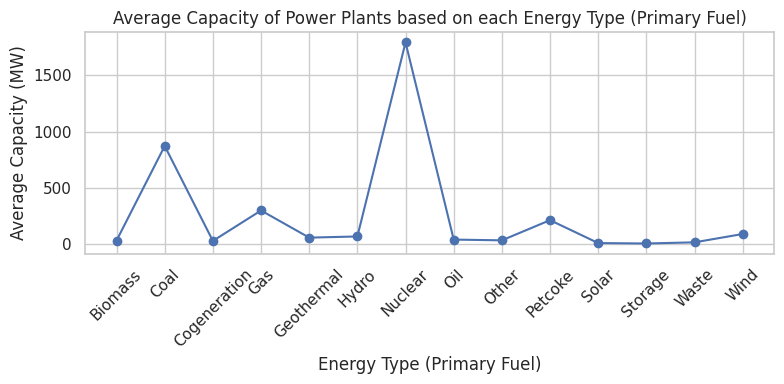

In [ ]:
# 4d

# Create a line graph
plt.figure(figsize=(8, 4))
plt.plot(total_capacity_by_fuel['Primary Fuel'], total_capacity_by_fuel['Total Capacity (MW)'], marker='o', linestyle='-')
plt.xlabel('Energy Type (Primary Fuel')
plt.ylabel('Total Capacity (MW)')
plt.title('Total Capacity of Power Plants based on each Energy Type (Primary Fuel)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('line_graph.jpg')

# create a line graph
plt.figure(figsize=(8, 4))
plt.plot(total_capacity_by_fuel['Primary Fuel'], total_capacity_by_fuel['Total Count'], marker='o', linestyle='-')
plt.xlabel('Energy Type (Primary Fuel)')
plt.ylabel('Total Count')
plt.title('Total Number of Power Plants for each Energy Type (Primary Fuel)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('line_graph.jpg')

# Create a line graph
plt.figure(figsize=(8, 4))
plt.plot(total_capacity_by_fuel['Primary Fuel'], total_capacity_by_fuel['Average Capacity'], marker='o', linestyle='-')
plt.xlabel('Energy Type (Primary Fuel)')
plt.ylabel('Average Capacity (MW)')
plt.title('Average Capacity of Power Plants based on each Energy Type (Primary Fuel)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('line_graph.jpg')

# Question 5

5a. What are the capacity_mw in each state?

5b. Which state has capacity for the highest power production?




In [ ]:
# 5a.

# What are the capacity_mw in each state?
capacity_by_state = joined_data.groupby('State')['Total Capacity (MW)'].sum().reset_index()
print("\n2. Total Capacity (MW) in Each State:")
capacity_by_state


2. Total Capacity (MW) in Each State:


,State,Total Capacity (MW)
0,Alabama,30632.90
1,Alaska,3011.00
2,Arizona,31359.70
3,Arkansas,16368.20
4,California,80747.40
5,Colorado,18385.90
6,Connecticut,9114.20
7,Delaware,3595.00
8,District of Columbia,43.90
9,Florida,66732.30


In [ ]:
# 5b.

# Which state produces the most power?
biggest_producing_state = capacity_by_state.loc[capacity_by_state['Total Capacity (MW)'].idxmax()]
print("\n3. State Producing the Most Power:")
biggest_producing_state


3. State Producing the Most Power:


State                     Texas
Total Capacity (MW)    135357.3
Name: 45, dtype: object

# Question 6

6. Which at the top five US states for each energy type for 2013-2017?




In [ ]:
# combined state and energy type level: merged_energy_type_state
merged_energy_type_state

,State,Primary Fuel,Total Capacity (MW),Total Count
0,Alabama,Biomass,602.7,10
1,Alabama,Coal,3360.0,2
2,Alabama,Gas,17592.2,27
3,Alabama,Hydro,3486.3,24
4,Alabama,Nuclear,5270.4,2
...,...,...,...,...
459,Wyoming,Hydro,303.4,16
460,Wyoming,Oil,4.7,2
461,Wyoming,Other,11.5,1
462,Wyoming,Solar,92.0,1


In [ ]:
# Sort the DataFrame by 'Total Capacity (MW)' in descending order
merged_energy_type_state_sorted = merged_energy_type_state.sort_values(by='Total Capacity (MW)', ascending=False)

# Create an empty DataFrame to store the top five producers for each energy type
top_producers_df = pd.DataFrame()

# Iterate over unique energy types
for energy_type in merged_energy_type_state['Primary Fuel'].unique():
    # Select rows for the current energy type
    energy_type_df = merged_energy_type_state_sorted[merged_energy_type_state_sorted['Primary Fuel'] == energy_type]

    # Select the top five producers for the current energy type
    top_producers = energy_type_df.nlargest(5, 'Total Capacity (MW)')

    # Append the selected rows to the result DataFrame
    top_producers_df = top_producers_df.append(top_producers)

# Display the result
top_producers_df


<ipython-input-208-8563a23216bd>:16: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-208-8563a23216bd>:16: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-208-8563a23216bd>:16: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-208-8563a23216bd>:16: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-208-8563a23216bd>:16: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-208-8563a23216bd>:16: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future versi

,State,Primary Fuel,Total Capacity (MW),Total Count
84,Georgia,Biomass,711.0,10
0,Alabama,Biomass,602.7,10
163,Louisiana,Biomass,475.4,6
174,Maine,Biomass,358.0,4
73,Florida,Biomass,347.4,8
...,...,...,...,...
171,Louisiana,Petcoke,1707.3,1
324,Ohio,Petcoke,172.5,2
90,Georgia,Petcoke,140.4,1
453,Wisconsin,Petcoke,117.4,1


In [ ]:
# Sort the DataFrame by 'Total Capacity (MW)' in descending order
merged_energy_type_state_sorted = merged_energy_type_state.sort_values(by='Total Capacity (MW)', ascending=False)

# Create an empty list to store DataFrames for each energy type
dfs_to_concat = []

# Iterate over unique energy types
for energy_type in merged_energy_type_state['Primary Fuel'].unique():
    # Select rows for the current energy type
    energy_type_df = merged_energy_type_state_sorted[merged_energy_type_state_sorted['Primary Fuel'] == energy_type]

    # Select the top five producers for the current energy type
    top_producers = energy_type_df.nlargest(5, 'Total Capacity (MW)')

    # Append the selected DataFrame to the list
    dfs_to_concat.append(top_producers)

# Concatenate the list of DataFrames into the result DataFrame
top_producers_df = pd.concat(dfs_to_concat, ignore_index=True)

# Display the result
print(top_producers_df)

        State Primary Fuel  Total Capacity (MW)  Total Count
0     Georgia      Biomass                711.0           10
1     Alabama      Biomass                602.7           10
2   Louisiana      Biomass                475.4            6
3       Maine      Biomass                358.0            4
4     Florida      Biomass                347.4            8
..        ...          ...                  ...          ...
65  Louisiana      Petcoke               1707.3            1
66       Ohio      Petcoke                172.5            2
67    Georgia      Petcoke                140.4            1
68  Wisconsin      Petcoke                117.4            1
69      Texas      Petcoke                 81.5            3

[70 rows x 4 columns]


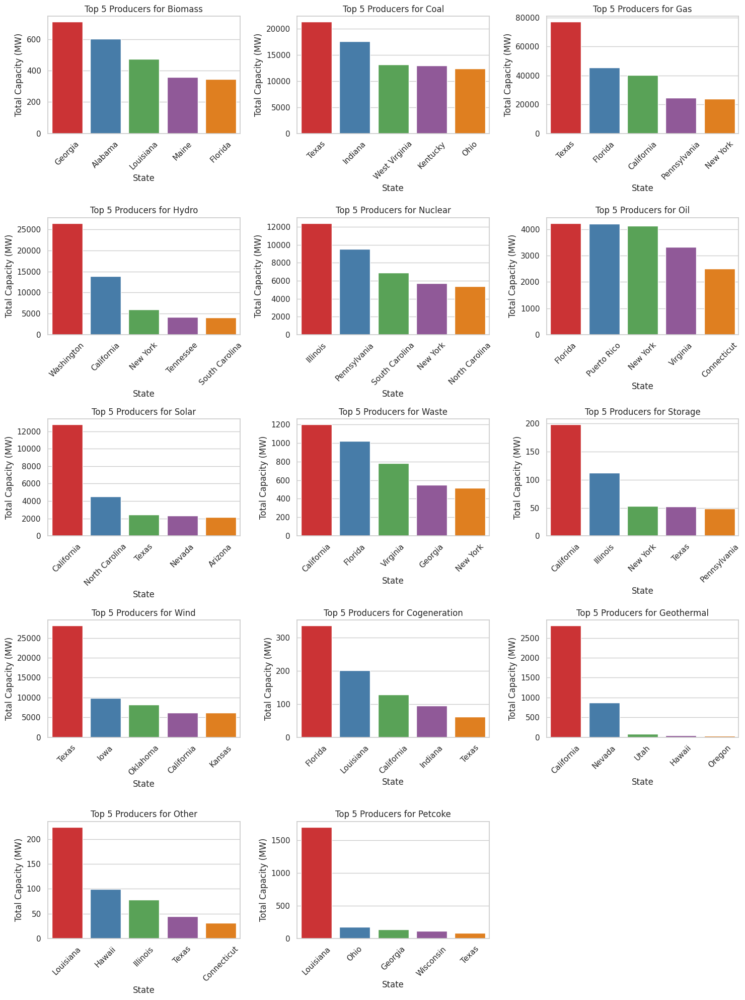

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define a custom color palette for better contrast
custom_palette = sns.color_palette("Set1", n_colors=5)

# Set the style using seaborn (optional)
sns.set(style="whitegrid")

# Get unique energy types
energy_types = top_producers_df['Primary Fuel'].unique()

# Calculate the number of rows and columns for subplots
num_rows = (len(energy_types) + 2) // 3  # 3 subplots per row
num_cols = min(3, len(energy_types))

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 4 * num_rows))

# Flatten the axes if there is more than one row
axes = axes.flatten()

# Plot each energy type on a separate subplot
for i, energy_type in enumerate(energy_types):
    # Filter data for the current energy type
    energy_type_data = top_producers_df[top_producers_df['Primary Fuel'] == energy_type]

    # Plot a vertical bar chart with the custom color palette
    sns.barplot(x='State', y='Total Capacity (MW)', data=energy_type_data, palette=custom_palette, ax=axes[i])

    # Add labels and title
    axes[i].set_xlabel('State')
    axes[i].set_ylabel('Total Capacity (MW)')
    axes[i].set_title(f'Top 5 Producers for {energy_type}')

    # Rotate x-axis labels for better readability
    axes[i].tick_params(axis='x', rotation=45)

# Remove any empty subplots
for i in range(len(energy_types), len(axes)):
    fig.delaxes(axes[i])

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
# 7. Interactive map

# First, merge the GeoDataFrame with the DataFrame on the 'State' column
geo_new_df_reg = geo_us_data.merge(select_merged_by_state, on='State')
geo_new_df_reg

,State,Name,Primary Fuel,Total Capacity (MW)_x,Latitude,Longitude,GEOID,geometry_x,STUSPS,LSAD,ALAND,AWATER,Power Plant Count,Total Capacity (MW)_y,Total Estimated 2013 Generation (gwh),Total Estimated 2014 Generation (gwh),Total Estimated 2015 Generation (gwh),Total Estimated 2016 Generation (gwh),Total Estimated 2017 Generation (gwh),geometry_y
0,New York,100 Brook Hill Drive Solar,Solar,2.0,41.0930,-73.9828,36,POINT (-73.98280 41.09300),NY,00,1.220491e+11,1.924699e+10,576,43483.8,29681.39,29875.58,29656.26,29976.83,163618.76,"MULTIPOLYGON (((-72.03496 41.25546, -72.02944 ..."
1,New York,25 Ashdown Road Solar LLC,Solar,4.0,42.8826,-73.8790,36,POINT (-73.87900 42.88260),NY,00,1.220491e+11,1.924699e+10,576,43483.8,29681.39,29875.58,29656.26,29976.83,163618.76,"MULTIPOLYGON (((-72.03496 41.25546, -72.02944 ..."
2,New York,500MW CC,Gas,528.0,40.7889,-73.9069,36,POINT (-73.90690 40.78890),NY,00,1.220491e+11,1.924699e+10,576,43483.8,29681.39,29875.58,29656.26,29976.83,163618.76,"MULTIPOLYGON (((-72.03496 41.25546, -72.02944 ..."
3,New York,59th Street,Gas,17.1,40.7713,-73.9912,36,POINT (-73.99120 40.77130),NY,00,1.220491e+11,1.924699e+10,576,43483.8,29681.39,29875.58,29656.26,29976.83,163618.76,"MULTIPOLYGON (((-72.03496 41.25546, -72.02944 ..."
4,New York,74th Street,Oil,37.0,40.7680,-73.9515,36,POINT (-73.95150 40.76800),NY,00,1.220491e+11,1.924699e+10,576,43483.8,29681.39,29875.58,29656.26,29976.83,163618.76,"MULTIPOLYGON (((-72.03496 41.25546, -72.02944 ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9809,Guam,Dededo CT 1,Oil,72.4,13.4170,144.6869,66,POINT (144.68690 13.41700),GU,00,5.435558e+08,9.343375e+08,7,528.0,0.00,0.00,0.00,60.27,358.75,"MULTIPOLYGON (((144.64233 13.24190, 144.64949 ..."
9810,Guam,Marbo CT,Oil,16.0,13.5129,144.8720,66,POINT (144.87200 13.51290),GU,00,5.435558e+08,9.343375e+08,7,528.0,0.00,0.00,0.00,60.27,358.75,"MULTIPOLYGON (((144.64233 13.24190, 144.64949 ..."
9811,Guam,Piti 8 (MEC),Oil,128.0,13.4624,144.6903,66,POINT (144.69030 13.46240),GU,00,5.435558e+08,9.343375e+08,7,528.0,0.00,0.00,0.00,60.27,358.75,"MULTIPOLYGON (((144.64233 13.24190, 144.64949 ..."
9812,Guam,Tanguisson 1 (PRUVIENT),Oil,53.0,13.5415,144.8082,66,POINT (144.80820 13.54150),GU,00,5.435558e+08,9.343375e+08,7,528.0,0.00,0.00,0.00,60.27,358.75,"MULTIPOLYGON (((144.64233 13.24190, 144.64949 ..."


In [ ]:
geo_new_df = geo_new_df_reg[['State', 'Name', 'Primary Fuel', 'Total Capacity (MW)_x',	'Latitude',	'Longitude','geometry_x','Power Plant Count',	'Total Capacity (MW)_y',	'Total Estimated 2013 Generation (gwh)',	'Total Estimated 2014 Generation (gwh)',	'Total Estimated 2015 Generation (gwh)',	'Total Estimated 2016 Generation (gwh)',	'Total Estimated 2017 Generation (gwh)'	]]
geo_new_df

,State,Name,Primary Fuel,Total Capacity (MW)_x,Latitude,Longitude,geometry_x,Power Plant Count,Total Capacity (MW)_y,Total Estimated 2013 Generation (gwh),Total Estimated 2014 Generation (gwh),Total Estimated 2015 Generation (gwh),Total Estimated 2016 Generation (gwh),Total Estimated 2017 Generation (gwh)
0,New York,100 Brook Hill Drive Solar,Solar,2.0,41.0930,-73.9828,POINT (-73.98280 41.09300),576,43483.8,29681.39,29875.58,29656.26,29976.83,163618.76
1,New York,25 Ashdown Road Solar LLC,Solar,4.0,42.8826,-73.8790,POINT (-73.87900 42.88260),576,43483.8,29681.39,29875.58,29656.26,29976.83,163618.76
2,New York,500MW CC,Gas,528.0,40.7889,-73.9069,POINT (-73.90690 40.78890),576,43483.8,29681.39,29875.58,29656.26,29976.83,163618.76
3,New York,59th Street,Gas,17.1,40.7713,-73.9912,POINT (-73.99120 40.77130),576,43483.8,29681.39,29875.58,29656.26,29976.83,163618.76
4,New York,74th Street,Oil,37.0,40.7680,-73.9515,POINT (-73.95150 40.76800),576,43483.8,29681.39,29875.58,29656.26,29976.83,163618.76
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9809,Guam,Dededo CT 1,Oil,72.4,13.4170,144.6869,POINT (144.68690 13.41700),7,528.0,0.00,0.00,0.00,60.27,358.75
9810,Guam,Marbo CT,Oil,16.0,13.5129,144.8720,POINT (144.87200 13.51290),7,528.0,0.00,0.00,0.00,60.27,358.75
9811,Guam,Piti 8 (MEC),Oil,128.0,13.4624,144.6903,POINT (144.69030 13.46240),7,528.0,0.00,0.00,0.00,60.27,358.75
9812,Guam,Tanguisson 1 (PRUVIENT),Oil,53.0,13.5415,144.8082,POINT (144.80820 13.54150),7,528.0,0.00,0.00,0.00,60.27,358.75


In [ ]:
# transform merged_state_new to a dataframe

import geopandas as gpd
from shapely.geometry import Point

# Create a GeoDataFrame from the existing DataFrame
geometry = [Point(xy) for xy in zip(geo_new_df['Longitude'], geo_new_df['Latitude'])]
geo_new_df = gpd.GeoDataFrame(geo_new_df, geometry=geometry)

# Display the GeoDataFrame
geo_new_df.head()

,State,Name,Primary Fuel,Total Capacity (MW)_x,Latitude,Longitude,geometry_x,Power Plant Count,Total Capacity (MW)_y,Total Estimated 2013 Generation (gwh),Total Estimated 2014 Generation (gwh),Total Estimated 2015 Generation (gwh),Total Estimated 2016 Generation (gwh),Total Estimated 2017 Generation (gwh),geometry
0,New York,100 Brook Hill Drive Solar,Solar,2.0,41.0930,-73.9828,POINT (-73.98280 41.09300),576,43483.8,29681.39,29875.58,29656.26,29976.83,163618.76,POINT (-73.98280 41.09300)
1,New York,25 Ashdown Road Solar LLC,Solar,4.0,42.8826,-73.8790,POINT (-73.87900 42.88260),576,43483.8,29681.39,29875.58,29656.26,29976.83,163618.76,POINT (-73.87900 42.88260)
2,New York,500MW CC,Gas,528.0,40.7889,-73.9069,POINT (-73.90690 40.78890),576,43483.8,29681.39,29875.58,29656.26,29976.83,163618.76,POINT (-73.90690 40.78890)
3,New York,59th Street,Gas,17.1,40.7713,-73.9912,POINT (-73.99120 40.77130),576,43483.8,29681.39,29875.58,29656.26,29976.83,163618.76,POINT (-73.99120 40.77130)
4,New York,74th Street,Oil,37.0,40.7680,-73.9515,POINT (-73.95150 40.76800),576,43483.8,29681.39,29875.58,29656.26,29976.83,163618.76,POINT (-73.95150 40.76800)


In [ ]:
geo_new_df.columns

Index(['State', 'Name', 'Primary Fuel', 'Total Capacity (MW)_x', 'Latitude',
       'Longitude', 'geometry_x', 'Power Plant Count', 'Total Capacity (MW)_y',
       'Total Estimated 2013 Generation (gwh)',
       'Total Estimated 2014 Generation (gwh)',
       'Total Estimated 2015 Generation (gwh)',
       'Total Estimated 2016 Generation (gwh)',
       'Total Estimated 2017 Generation (gwh)', 'geometry'],
      dtype='object')

In [ ]:
# Check if grouped_aggregate1 is a GeoDataFrame
if isinstance(geo_new_df, gpd.GeoDataFrame):
    print("geo_new_df is a GeoDataFrame")
else:
    print("geo_new_df is not a GeoDataFrame")

geo_new_df is a GeoDataFrame


In [ ]:
import geopandas as gpd
from shapely.geometry import Point

# Assuming you have a GeoDataFrame with Point geometries
geometry = geo_new_df['geometry']
geo_new_df2 = gpd.GeoDataFrame(geometry=gpd.GeoSeries(geometry))

# Set the CRS to WGS84 (EPSG:4326)
geo_new_df2.crs = "EPSG:4326"

# Print the GeoDataFrame
print(geo_new_df2)

                        geometry
0     POINT (-73.98280 41.09300)
1     POINT (-73.87900 42.88260)
2     POINT (-73.90690 40.78890)
3     POINT (-73.99120 40.77130)
4     POINT (-73.95150 40.76800)
...                          ...
9809  POINT (144.68690 13.41700)
9810  POINT (144.87200 13.51290)
9811  POINT (144.69030 13.46240)
9812  POINT (144.80820 13.54150)
9813  POINT (144.89990 13.52430)

[9814 rows x 1 columns]


In [ ]:
! pip install plotly

In [ ]:
! pip install dash

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 36.2 MB/s eta 0:00:00


In [ ]:
! pip install dash pandas plotly geopandas


In [ ]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.express as px
import geopandas as gpd

# Replace these with your actual data
# us_states_gdf = ...
# geo_us_data = ...

# Create a GeoJSON representation of the US States GeoDataFrame
geojson_us_states = us_states_gdf.__geo_interface__

# Create a GeoDataFrame for power plants with a geometry column
scatter_geojson = gpd.GeoDataFrame(geo_us_data, geometry=gpd.points_from_xy(geo_us_data.Longitude, geo_us_data.Latitude))

# Initialize the Dash app
app = dash.Dash(__name__)

# Define the layout of the dashboard
app.layout = html.Div([
    # Title
    html.H1("US Power Plant Dashboard"),

    # Dropdown to select property
    html.Label("Select Property:"),
    dcc.Dropdown(
        id='property-dropdown',
        options=[
            {'label': 'Total Capacity (MW)', 'value': 'Total Capacity (MW)'},
            {'label': 'Power Plant Count', 'value': 'Power Plant Count'},
            # Add more properties as needed
        ],
        value='Total Capacity (MW)',
        style={'width': '50%'}
    ),

    # Map showing power plants
    dcc.Graph(id='map-graph'),

    # Bar chart showing property by state
    dcc.Graph(id='bar-chart'),

])

# Callback to update graphs based on property selection
@app.callback(
    [Output('map-graph', 'figure'),
     Output('bar-chart', 'figure')],
    [Input('property-dropdown', 'value')]
)
def update_graphs(selected_property):
    # Choropleth map showing power plants
    map_fig = px.choropleth_mapbox(
        geo_us_data,
        geojson=geojson_us_states,
        locations=geo_us_data.index,
        color=selected_property,
        mapbox_style="carto-positron",
        zoom=3,
        center={"lat": 37.0902, "lon": -95.7129},
        opacity=0.5,
        title=f"{selected_property} Across US States",
    )

    # Bar chart showing property by state
    bar_chart_fig = px.bar(
        geo_us_data,
        x="State",
        y=selected_property,
        color=selected_property,
        title=f"{selected_property} by State",
    )

    return map_fig, bar_chart_fig

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)


<IPython.core.display.Javascript object>

In [ ]:
# interactive graphs i
# Number of Power Plants by State

import plotly.express as px

# Convert GeoDataFrame to GeoJSON
geojson_us_states = us_states_gdf.__geo_interface__

# Create a choropleth map with annotations for the number of power plants
fig = px.choropleth(
    merged_by_state,
    geojson=merged_by_state.geometry.__geo_interface__,
    locations=merged_by_state.index,
    color="Power Plant Count",
    color_continuous_scale="OrRd",
    projection="mercator",
    title='Number of Power Plants by State',
    labels={'Power Plant Count': 'Number of Power Plants'},
)

# Show the plot
fig.show()


In [ ]:
# interactive graphs ii

# total capacity

# Create a choropleth map with a different colormap
fig = px.choropleth(
    merged_by_state_full,
    geojson=merged_by_state_full.geometry.__geo_interface__,
    locations=merged_by_state_full.index,
    color="Total Capacity (MW)",
    color_continuous_scale="Blues",
    projection="mercator",
    title='Total Capacity of Power Plants in MW',
    labels={'Total Capacity (MW)': 'Total Capacity (MW)'},
)

# Show the plot
fig.show()

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
import geopandas as gpd

# Choropleth map of US states
fig = px.choropleth_mapbox(
    geo_us_data,
    geojson=geo_us_data.geometry.__geo_interface__,  # Convert GeoDataFrame to GeoJSON
    locations=geo_us_data.index,
    color="Total Capacity (MW)",
    hover_data={"State": True, "Total Capacity (MW)": True},
    mapbox_style="carto-positron",
    zoom=4,
    center={"lat": 37.0902, "lon": -95.7129},
    opacity=0.5,
    title="US Power Plant Statistics"
)

# Scatter plot for power plants
scatter_geojson = gpd.GeoDataFrame(geo_new_df, geometry=gpd.points_from_xy(geo_new_df.Longitude, geo_new_df.Latitude))
scatter = px.scatter_mapbox(
    scatter_geojson,
    lat="Latitude",
    lon="Longitude",
    hover_data={"Name": True, "State": True, "Total Capacity (MW)_y": True},
    color="Total Capacity (MW)_y",
    size="Total Capacity (MW)_y",
)

# Update map layout
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    mapbox=dict(center={"lat": 37.0902, "lon": -95.7129}, zoom=3),
    width=1500,
    height=1000,
)

# Add scatter plot to the map
fig.add_trace(scatter.data[0])

# Create bar charts for total power plant count and total estimated generation
bar_chart_count = px.bar(
    geo_new_df,
    x="State",
    y="Power Plant Count",
    color="Total Capacity (MW)_y",
    title="Total Power Plant Count by State",
)

bar_chart_generation = px.bar(
    geo_new_df,
    x="State",
    y="Total Estimated 2017 Generation (gwh)",
    color="Total Capacity (MW)_y",
    title="Total Estimated Generation by State",
)

# Combine the map and the bar chart
fig.add_trace(go.Bar(x=bar_chart_count.data[0]['x'], y=bar_chart_count.data[0]['y'], marker=dict(color=bar_chart_count.data[0]['marker']['color'])))
fig.add_trace(go.Bar(x=bar_chart_generation.data[0]['x'], y=bar_chart_generation.data[0]['y'], marker=dict(color=bar_chart_generation.data[0]['marker']['color'])))

# Update annotations to move legend and instructions down
fig.update_layout(
    annotations=[
        dict(
            x=0.5,
            y=-0.25,
            xref="paper",
            yref="paper",
            showarrow=False,
            text="Click on a state to see details of power plants, total power plant count, total capacity, and total estimated generation.",
        )
    ],
    legend=dict(
        y=-0.3
    )
)

# Add buttons for different datasets
button_menu = [
    dict(label="Total Capacity", method="relayout", args=["mapbox.layers[0].source", geo_us_data.geometry.__geo_interface__]),
    dict(label="Power Plant Count", method="relayout", args=["mapbox.layers[0].source", bar_chart_count.data[0]['x']]),
    dict(label="Total Estimated Generation", method="relayout", args=["mapbox.layers[0].source", bar_chart_generation.data[0]['x']]),
]

# Add buttons to the layout
fig.update_layout(
    updatemenus=[
        dict(
            type="buttons",
            showactive=False,
            buttons=button_menu,
            x=0.5,  # Adjust this value to center the buttons horizontally
            xanchor="center",
            y=1.15,
            yanchor="top",
        ),
    ],
)

# Show the interactive map
fig.show()


#  My laptop kept crashing upon loading the interactive maps.